## Importing libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import pandas_profiling
import seaborn as sns
sns.set_theme(style='darkgrid', color_codes=True, font_scale=1)

## Load the data

In [2]:
df = pd.read_csv('Digital Wellbeing Questionnaire - Negatively valued aspects of Mobile Connectivity.csv')
print (df.shape)
df.head()

(444, 50)


,Timestamp,Gender,Age,Residence,Sleeping hours,Sleep Satisfaction,How often you are connected to Internet?,Satisfaction with academic study during pandemic,Academic Level,Geographical Location,...,GMH-3,GMH-4,GMH-5,AM-1,AM-2,AM-3,AM-4,AM-5,AM-6,AM-7
0,9/3/2021 10:06,Male,Between 21 to 25 Years,Big City,7-9 hours,Modest,Frequently,Modest,Undergraduate- Third Year,South Asia,...,4,4,4,4,3,4,4,4,4,4
1,9/3/2021 10:06,Female,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Low,Undergraduate- Third Year,South Asia,...,3,3,2,2,3,2,3,2,3,2
2,9/3/2021 10:07,Female,Between 21 to 25 Years,Big City,Below 7 hours,Low,Frequently,Low,Undergraduate- Third Year,South Asia,...,2,2,2,3,3,3,3,3,3,3
3,9/3/2021 10:08,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Modest,Undergraduate- Third Year,Middle East Asia,...,4,4,4,4,4,4,4,4,4,4
4,9/3/2021 10:08,Male,Between 21 to 25 Years,Big City,7-9 hours,High,Always,High,Undergraduate- Third Year,South East Asia,...,5,4,4,1,1,1,1,1,1,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 444 entries, 0 to 443
Data columns (total 50 columns):
 #   Column                                            Non-Null Count  Dtype 
---  ------                                            --------------  ----- 
 0   Timestamp                                         444 non-null    object
 1   Gender                                            444 non-null    object
 2   Age                                               444 non-null    object
 3   Residence                                         444 non-null    object
 4   Sleeping hours                                    444 non-null    object
 5   Sleep Satisfaction                                444 non-null    object
 6   How often you are connected to Internet?          444 non-null    object
 7   Satisfaction with academic study during pandemic  444 non-null    object
 8   Academic Level                                    444 non-null    object
 9   Geographical Location           

## Data preparation & data cleaning.

In [4]:
df.rename(
    columns = {
        'How often you are connected to Internet?': 'Connected_to_Internet',
        'Sleeping hours': 'Sleeping_hours',
        'Sleep Satisfaction': 'Sleep_Satisfaction',
        'Satisfaction with academic study during pandemic': 'Academic_Study_Satisfaction',
        'Academic Level': 'Academic_Level',
        'Geographical Location': 'Geographical_Location'}, inplace = True)

del df['Timestamp']  # Deleting Timestamp column since it is not useful.

df.head()

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location,DS-1,...,GMH-3,GMH-4,GMH-5,AM-1,AM-2,AM-3,AM-4,AM-5,AM-6,AM-7
0,Male,Between 21 to 25 Years,Big City,7-9 hours,Modest,Frequently,Modest,Undergraduate- Third Year,South Asia,3,...,4,4,4,4,3,4,4,4,4,4
1,Female,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Low,Undergraduate- Third Year,South Asia,2,...,3,3,2,2,3,2,3,2,3,2
2,Female,Between 21 to 25 Years,Big City,Below 7 hours,Low,Frequently,Low,Undergraduate- Third Year,South Asia,2,...,2,2,2,3,3,3,3,3,3,3
3,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Modest,Undergraduate- Third Year,Middle East Asia,3,...,4,4,4,4,4,4,4,4,4,4
4,Male,Between 21 to 25 Years,Big City,7-9 hours,High,Always,High,Undergraduate- Third Year,South East Asia,0,...,5,4,4,1,1,1,1,1,1,1


In [5]:
df.describe(include='all')

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location,DS-1,...,GMH-3,GMH-4,GMH-5,AM-1,AM-2,AM-3,AM-4,AM-5,AM-6,AM-7
count,444,444,444,444,444,444,444,444,444,444.000000,...,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000
unique,2,5,3,3,3,3,3,5,8,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Modest,Undergraduate- First Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,291,271,332,264,251,292,211,179,324,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.608108,...,2.522523,2.425676,2.515766,2.727477,3.076577,2.984234,2.524775,2.927928,3.065315,3.067568
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.244229,...,1.058956,1.183547,1.172377,1.340483,1.348351,1.379379,1.405188,1.394680,1.451321,1.394906
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,...,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,2.000000,3.000000,3.000000,3.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,...,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000


In [6]:
Ashif=df[["Anxiety-1", "Anxiety-2", "Anxiety-3", "Anxiety-4", "Anxiety-5", "Anxiety-6", "Anxiety-7", "Depression-1", "Depression-2", "Depression-3", "Depression-4", "Depression-5", "Depression-6", "Depression-7", "GMH-1", "GMH-2", "GMH-3", "GMH-4", "GMH-5"]]

In [7]:
Ashif.describe()

,Anxiety-1,Anxiety-2,Anxiety-3,Anxiety-4,Anxiety-5,Anxiety-6,Anxiety-7,Depression-1,Depression-2,Depression-3,Depression-4,Depression-5,Depression-6,Depression-7,GMH-1,GMH-2,GMH-3,GMH-4,GMH-5
count,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000
mean,2.092342,2.189189,2.646396,2.256757,2.081081,2.159910,2.191441,1.547297,2.081081,1.686937,1.907658,1.806306,1.831081,1.475225,2.639640,2.477477,2.522523,2.425676,2.515766
std,1.356544,1.345596,1.254773,1.313869,1.376259,1.371795,1.357803,1.257040,1.239931,1.323075,1.314285,1.317826,1.486076,1.531260,1.041294,1.052542,1.058956,1.183547,1.172377
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000
50%,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000
75%,3.000000,3.000000,4.000000,3.000000,3.000000,3.000000,3.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
max,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [8]:
df.describe(include=['object'])

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location
count,444,444,444,444,444,444,444,444,444
unique,2,5,3,3,3,3,3,5,8
top,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Modest,Undergraduate- First Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani..."
freq,291,271,332,264,251,292,211,179,324


In [9]:
print(df['Age'].unique())

['Between 21 to 25 Years' 'Below 20 Years' 'Between 26 to 30 Years'
 'Above 35 Years' 'Between 31 to 35 Years']


In [10]:
print(df['Residence'].unique())

['Big City' 'Small City/ Town' 'Village/ Rural area']


In [11]:
print(df['Sleeping_hours'].unique())

['7-9 hours' 'Below 7 hours' 'Above 9 hours']


In [12]:
print(df['Sleep_Satisfaction'].unique())

['Modest' 'Low' 'High']


In [13]:
print(df['Connected_to_Internet'].unique())

['Frequently' 'Always' 'Sometimes']


In [14]:
print(df['Academic_Study_Satisfaction'].unique())

['Modest' 'Low' 'High']


In [15]:
print(df['Academic_Level'].unique())

['Undergraduate- Third Year' 'Postgraduate' 'Undergraduate- First Year'
 'Undergraduate- Fourth Year' 'Undergraduate- Second Year']


In [16]:
print(df['Geographical_Location'].unique())

['South Asia' 'Middle East Asia' 'South East Asia'
 'South Asia (e.g., Bangladesh, Pakistan, Afganistan, Maldives etc.)'
 'Others (Turkey and other countries)'
 'South East Asia  (e.g., Malaysia, Indonesia, Brunei etc.)'
 'Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)'
 'Middle East Asia (e.g., Saudi Arabiya, Qatar, UAE, Iran, Yemen etc.)']


## Statistical Report with Pandas Profiling

## Taking care of missing data

In [17]:
#from sklearn.impute import SimpleImputer
#imputer = SimpleImputer(missing_values=np.nan, strategy='mean', verbose=0)
#imputer = imputer.fit(X[:, :])
#X[:, :] = imputer.transform(X[:, :])

In [18]:
df.isnull().sum()

Gender                         0
Age                            0
Residence                      0
Sleeping_hours                 0
Sleep_Satisfaction             0
Connected_to_Internet          0
Academic_Study_Satisfaction    0
Academic_Level                 0
Geographical_Location          0
DS-1                           0
DS-2                           0
DS-3                           0
DS-4                           0
DS-5                           0
DS-6                           0
DS-7                           0
DS-8                           0
DS-9                           0
PS-1                           0
PS-2                           0
PS-3                           0
PS-4                           0
PS-5                           0
Anxiety-1                      0
Anxiety-2                      0
Anxiety-3                      0
Anxiety-4                      0
Anxiety-5                      0
Anxiety-6                      0
Anxiety-7                      0
Depression

## Correlation Heatmap

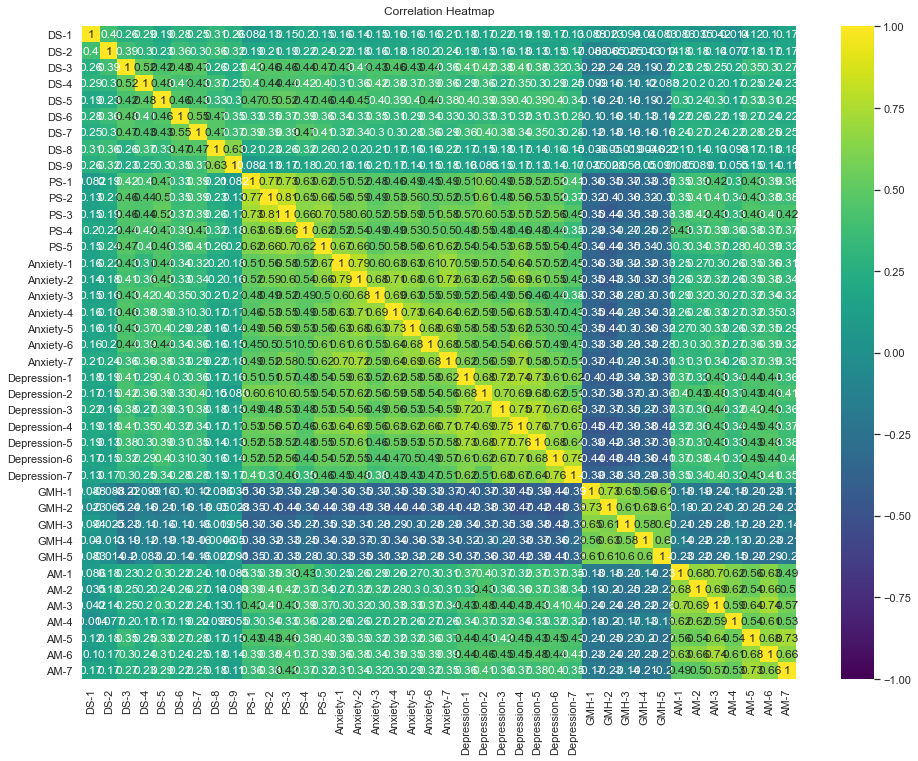

In [19]:
plt.figure(figsize=(16,12))

heatmap = sns.heatmap(df.corr(), vmin=-1,vmax=1, annot=True, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

## Exploratory Analysis & Visualizations.📚

In [20]:
df.Age.describe()

count                        444
unique                         5
top       Between 21 to 25 Years
freq                         271
Name: Age, dtype: object

In [21]:
fig = px.histogram(df, x = 'Age', marginal = 'box',
                   width = 900, height = 580, color_discrete_sequence=['plum'],)
fig.update_layout(title = 'Age distribution',
                  xaxis_title = 'Age groups',
                  yaxis_title = 'Number of students',
                  font = dict(family = 'Arial', size = 15),
                  bargap = 0.1)
fig.show();

## Scatter plot

## 📠📳💻 Digital Stress/ Social Stress
### 1.My friends expect me to be constantly available online.

In [22]:
fig = px.scatter(df, x = 'Age', y = 'DS-1', size = 'DS-1', color='Academic_Level')
fig.update_layout(title = 'Online availability',
                 xaxis_title = 'students of age',
                 yaxis_title = 'Level',
                 font = dict(family = 'Droid Serif', size = 14))
fig.show()

### 2. I felt pressure to stay connected to my friends irrespective of the place or time.

In [23]:
fig = px.scatter(df, x = 'Age', y = 'DS-2', size = 'DS-2', color='Academic_Level')
fig.update_layout(title = 'Felt pressure to stay connected to my friends',
                 xaxis_title = 'students of age',
                 yaxis_title = 'Level',
                 font = dict(family = 'Droid Serif', size = 14))
fig.show()

## 🙃Psychological stress
### 1.	I felt that I was unable to control the important things in my life.

In [24]:
fig = px.scatter(df, x = 'Age', y = 'PS-1', size = 'PS-1', color='Academic_Level')
fig.update_layout(title = 'Unable to control the important things of life.',
                 xaxis_title = 'students of age',
                 yaxis_title = 'Level',
                 font = dict(family = 'Droid Serif', size = 14))
fig.show()

### 5. I often felt emotionally exhausted.

In [25]:
fig = px.scatter(df, x = 'Age', y = 'PS-5', size = 'PS-5', color='Academic_Level')
fig.update_layout(title = 'Often felt emotionally exhausted.',
                 xaxis_title = 'students of age',
                 yaxis_title = 'Level',
                 font = dict(family = 'Droid Serif', size = 14))
fig.show()

## Anxiety 
### 1. I felt nervous, anxious or on edge.

In [26]:
fig = px.scatter(df, x = 'Age', y = 'Anxiety-1', size = 'Anxiety-1', color='Academic_Level')
fig.update_layout(title = 'Felt nervous, anxious or on edge.',
                 xaxis_title = 'students of age',
                 yaxis_title = 'Level',
                 font = dict(family = 'Droid Serif', size = 14))
fig.show()

## Depression
### 7. I felt that life was meaningless.

In [27]:
fig = px.scatter(df, x = 'Age', y = 'Depression-7', size = 'Depression-7', color='Academic_Level')
fig.update_layout(title = 'Felt that life was meaningless.',
                 xaxis_title = 'students of age',
                 yaxis_title = 'Level',
                 font = dict(family = 'Droid Serif', size = 14))
fig.show()

## 🌏Choropleth map.

#### Now we're going to make a new column: "AverageDigitalStress"

In [28]:
df["AverageDigitalStress"] = df[
    ["DS-1", "DS-2", "DS-3", "DS-4", "DS-5", "DS-6", "DS-7", "DS-8", "DS-9"]
].mean(axis=1)

#### Let's isolate the Asia data so we can show just Asia map.

In [29]:
asia_only = df.dropna(subset=["Geographical_Location"])

#### Let's also get the average values for each column by Geographical_Location.


In [30]:
avg_by_location = asia_only.groupby("Geographical_Location").mean()

#### Now, we just turn it into a choropleth map.

In [31]:
fig = px.choropleth(
    locations=avg_by_location.index,
    color=avg_by_location["AverageDigitalStress"],
    color_continuous_scale="rdbu_r",
    range_color=(-6, 6),
    scope="asia",
    locationmode="country names",  #['ISO-3', 'USA-states', 'country names', 'geojson-id']
    title="Average digital stress on student due to the coronavirus pandemic",
)

fig.show()

## 🎻Violin plot 

In [32]:
df["DigitalStress_9"] = df[
    ["DS-1", "DS-2", "DS-3", "DS-4", "DS-5", "DS-6", "DS-7", "DS-8", "DS-9"]
].sum(axis=1)

In [33]:
df["DigitalStress_9"]

0      23
1      17
2      16
3      27
4       1
       ..
439    20
440    35
441    34
442    12
443    18
Name: DigitalStress_9, Length: 444, dtype: int64

In [34]:
df.DigitalStress_9.describe()

count    444.000000
mean      17.549550
std        7.796786
min        0.000000
25%       12.000000
50%       18.000000
75%       23.000000
max       36.000000
Name: DigitalStress_9, dtype: float64

In [35]:
df["PsychologicalStress_5"] = df[
    ["PS-1", "PS-2", "PS-3", "PS-4", "PS-5"]
].sum(axis=1)

df["PsychologicalStress_5"]

0      11
1       9
2      10
3      10
4       0
       ..
439    18
440    13
441    20
442     8
443     4
Name: PsychologicalStress_5, Length: 444, dtype: int64

In [36]:
df.PsychologicalStress_5.describe()

count    444.000000
mean      10.855856
std        5.726808
min        0.000000
25%        6.000000
50%       11.000000
75%       15.000000
max       20.000000
Name: PsychologicalStress_5, dtype: float64

In [37]:
df["Anxiety_7"] = df[
    ["Anxiety-1", "Anxiety-2", "Anxiety-3", "Anxiety-4", "Anxiety-5", "Anxiety-6", "Anxiety-7"]
].sum(axis=1)

df["Anxiety_7"]

0      17
1      10
2      16
3      21
4       0
       ..
439    27
440    27
441    28
442    11
443     0
Name: Anxiety_7, Length: 444, dtype: int64

In [38]:
df.Anxiety_7.describe()

count    444.000000
mean      15.617117
std        7.905324
min        0.000000
25%        9.000000
50%       16.000000
75%       22.000000
max       28.000000
Name: Anxiety_7, dtype: float64

In [39]:
df["Depression_7"] = df[
    ["Depression-1", "Depression-2", "Depression-3", "Depression-4", "Depression-5", "Depression-6", "Depression-7"]
].sum(axis=1)

df["Depression_7"]

0      19
1      11
2      13
3      14
4       0
       ..
439    27
440    18
441    28
442     7
443     0
Name: Depression_7, Length: 444, dtype: int64

In [40]:
df.Depression_7.describe()

count    444.000000
mean      12.335586
std        8.086580
min        0.000000
25%        6.000000
50%       12.000000
75%       18.250000
max       28.000000
Name: Depression_7, dtype: float64

In [41]:
df["GeneralMentalHealth_5"] = df[
    ["GMH-1", "GMH-2", "GMH-3", "GMH-4", "GMH-5"]
].sum(axis=1)

df["GeneralMentalHealth_5"]

0      19
1      13
2      10
3      20
4      23
       ..
439     6
440     8
441     8
442    14
443    25
Name: GeneralMentalHealth_5, Length: 444, dtype: int64

In [42]:
df.GeneralMentalHealth_5.describe()

count    444.000000
mean      12.581081
std        4.584319
min        5.000000
25%        9.000000
50%       12.000000
75%       15.000000
max       25.000000
Name: GeneralMentalHealth_5, dtype: float64

In [43]:
df["AcademicMotivation_7"] = df[
    ["AM-1", "AM-2", "AM-3", "AM-4", "AM-5", "AM-6", "AM-7"]
].sum(axis=1)

df["AcademicMotivation_7"]

0      27
1      17
2      21
3      28
4       7
       ..
439    24
440    26
441    32
442    25
443    10
Name: AcademicMotivation_7, Length: 444, dtype: int64

In [44]:
df.AcademicMotivation_7.describe()

count    444.000000
mean      20.373874
std        7.966909
min        7.000000
25%       14.000000
50%       20.000000
75%       27.000000
max       35.000000
Name: AcademicMotivation_7, dtype: float64

### Now, it's time to try some plot

### Digital Stress

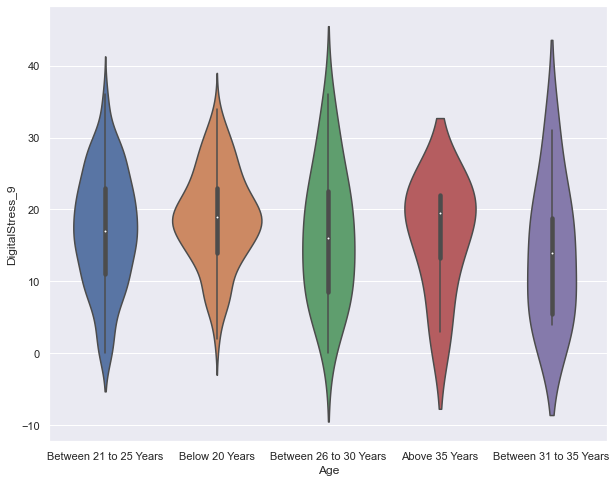

In [45]:
plt.figure(figsize=(10,8))
sns.set(style='darkgrid')
sns.violinplot(y='DigitalStress_9', x='Age', data=df)
plt.show()

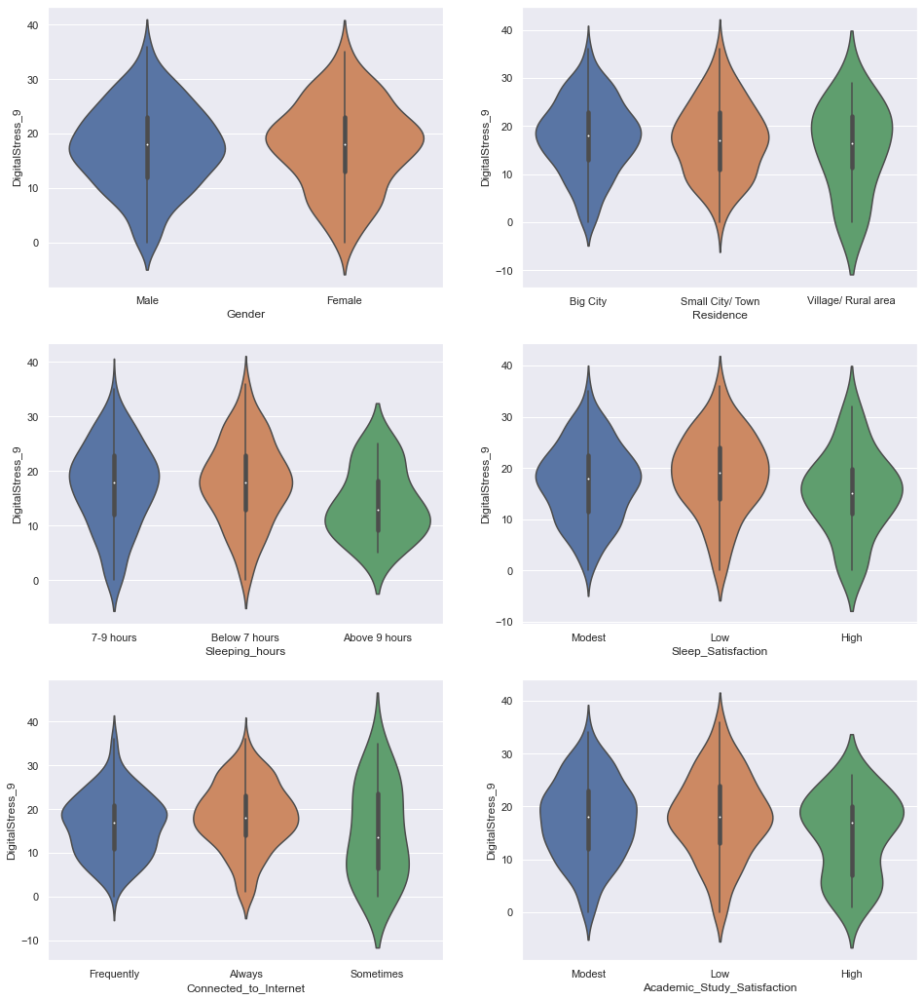

In [46]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,2, figsize=(16,18))
sns.violinplot(x='Gender', y='DigitalStress_9', data=df, ax=ax[0,0])
sns.violinplot(x='Residence', y='DigitalStress_9', data=df, ax=ax[0,1])
sns.violinplot(x='Sleeping_hours', y='DigitalStress_9', data=df, ax=ax[1,0])
sns.violinplot(x='Sleep_Satisfaction', y='DigitalStress_9', data=df, ax=ax[1,1])
sns.violinplot(x='Connected_to_Internet', y='DigitalStress_9', data=df, ax=ax[2,0])
sns.violinplot(x='Academic_Study_Satisfaction', y='DigitalStress_9', data=df, ax=ax[2,1])
plt.show()

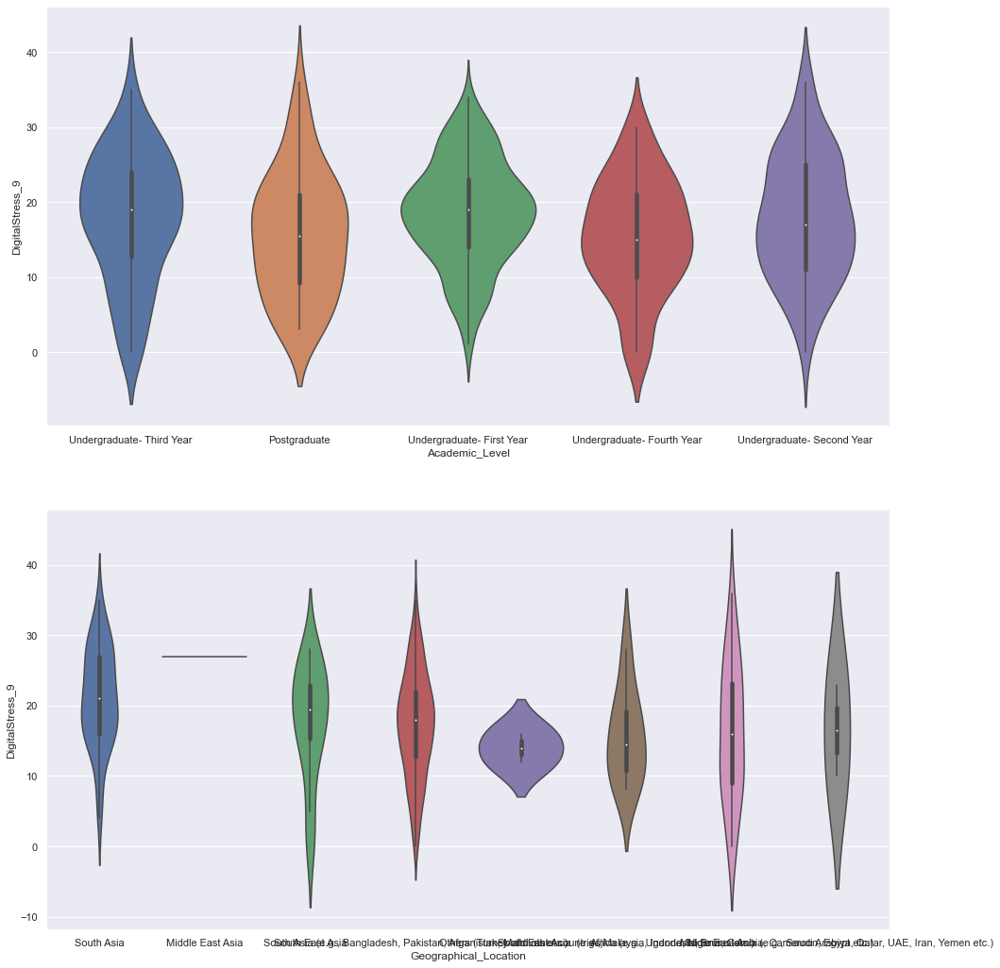

In [47]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(2,1, figsize=(16,18))
sns.violinplot(x='Academic_Level', y='DigitalStress_9', data=df, ax=ax[0])
sns.violinplot(x='Geographical_Location', y='DigitalStress_9', data=df, ax=ax[1])
plt.show()

### Psychological Stress

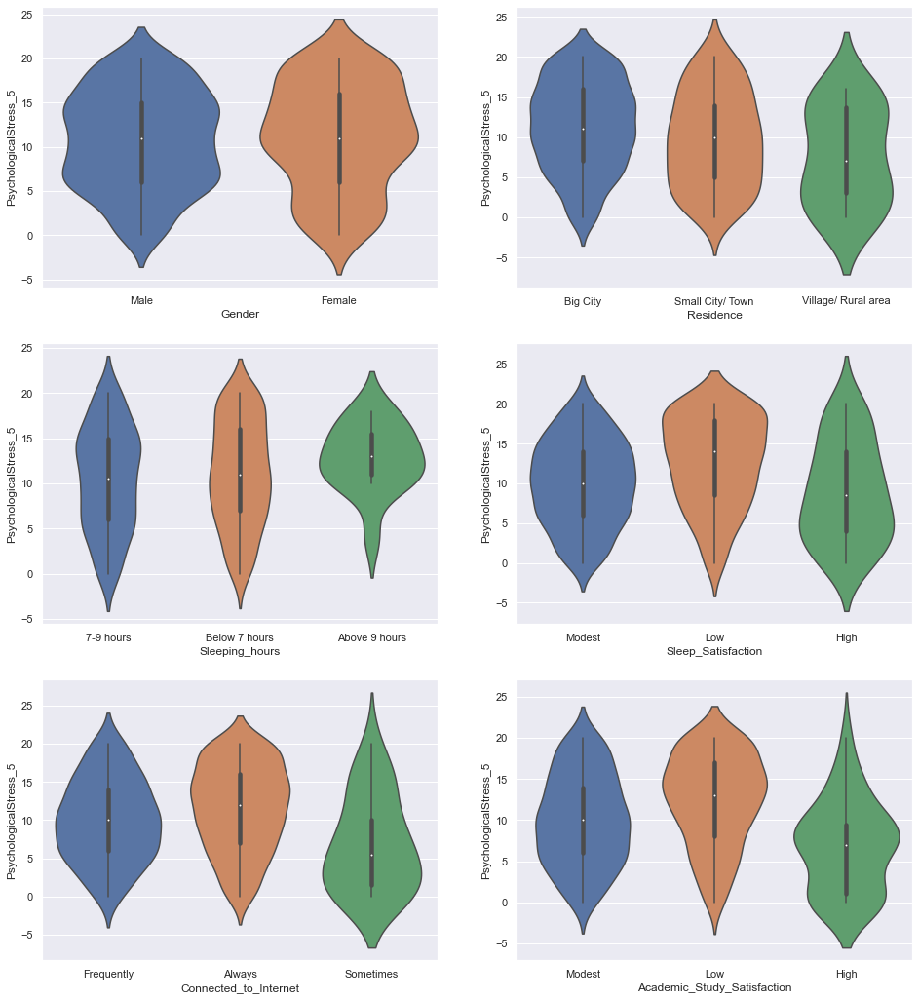

In [48]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,2, figsize=(16,18))
sns.violinplot(x='Gender', y='PsychologicalStress_5', data=df, ax=ax[0,0])
sns.violinplot(x='Residence', y='PsychologicalStress_5', data=df, ax=ax[0,1])
sns.violinplot(x='Sleeping_hours', y='PsychologicalStress_5', data=df, ax=ax[1,0])
sns.violinplot(x='Sleep_Satisfaction', y='PsychologicalStress_5', data=df, ax=ax[1,1])
sns.violinplot(x='Connected_to_Internet', y='PsychologicalStress_5', data=df, ax=ax[2,0])
sns.violinplot(x='Academic_Study_Satisfaction', y='PsychologicalStress_5', data=df, ax=ax[2,1])
plt.show()

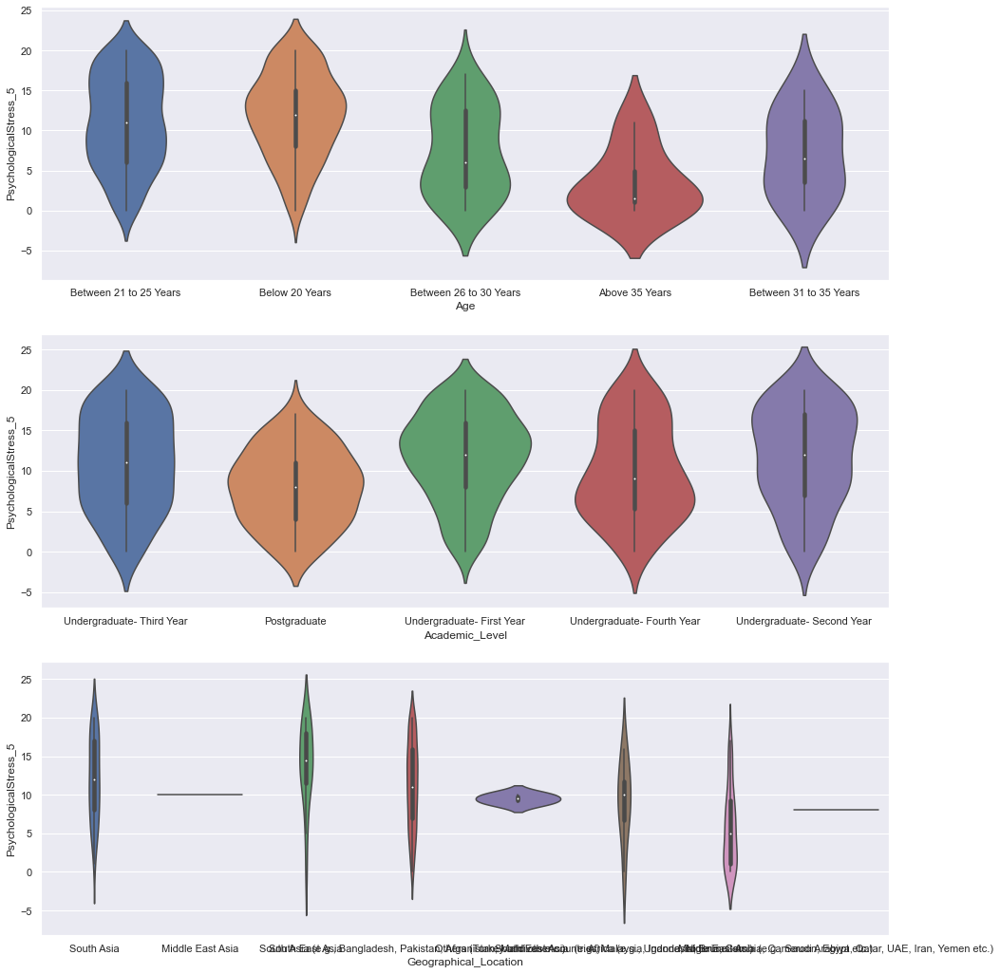

In [49]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,1, figsize=(16,18))
sns.violinplot(x='Age', y='PsychologicalStress_5', data=df, ax=ax[0])
sns.violinplot(x='Academic_Level', y='PsychologicalStress_5', data=df, ax=ax[1])
sns.violinplot(x='Geographical_Location', y='PsychologicalStress_5', data=df, ax=ax[2])
plt.show()

### Anxiety

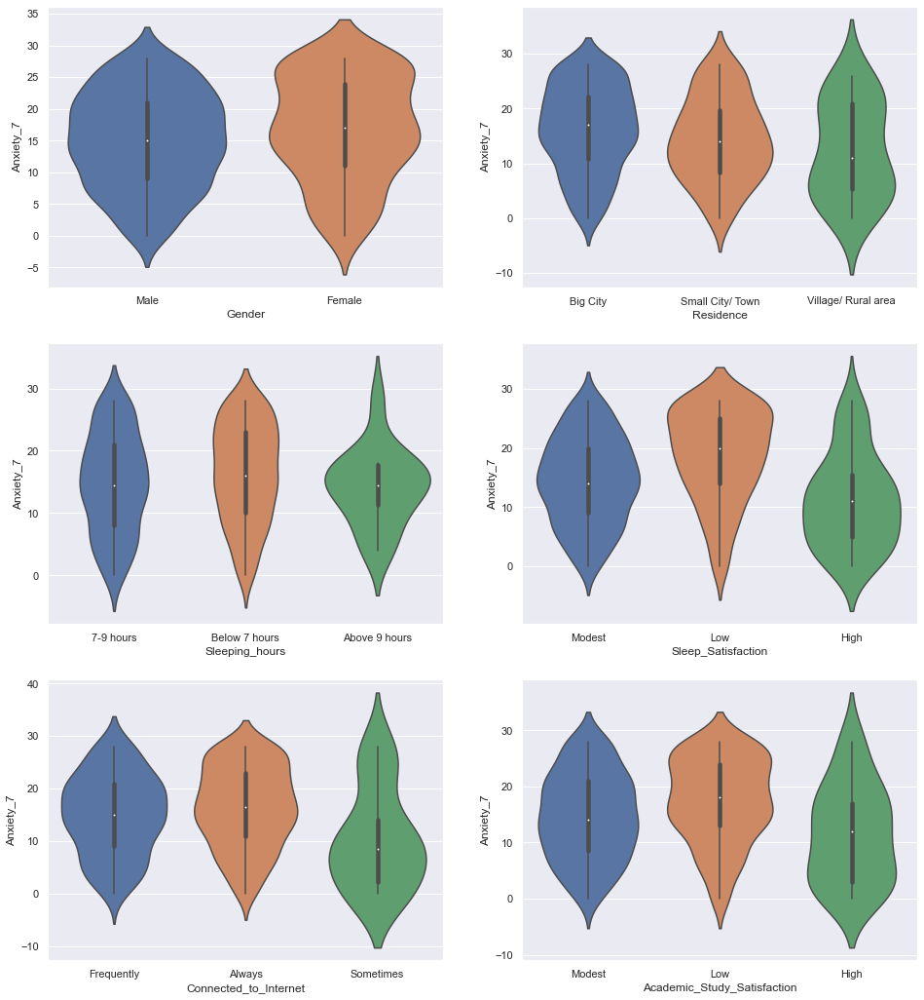

In [50]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,2, figsize=(16,18))
sns.violinplot(x='Gender', y='Anxiety_7', data=df, ax=ax[0,0])
sns.violinplot(x='Residence', y='Anxiety_7', data=df, ax=ax[0,1])
sns.violinplot(x='Sleeping_hours', y='Anxiety_7', data=df, ax=ax[1,0])
sns.violinplot(x='Sleep_Satisfaction', y='Anxiety_7', data=df, ax=ax[1,1])
sns.violinplot(x='Connected_to_Internet', y='Anxiety_7', data=df, ax=ax[2,0])
sns.violinplot(x='Academic_Study_Satisfaction', y='Anxiety_7', data=df, ax=ax[2,1])
plt.show()

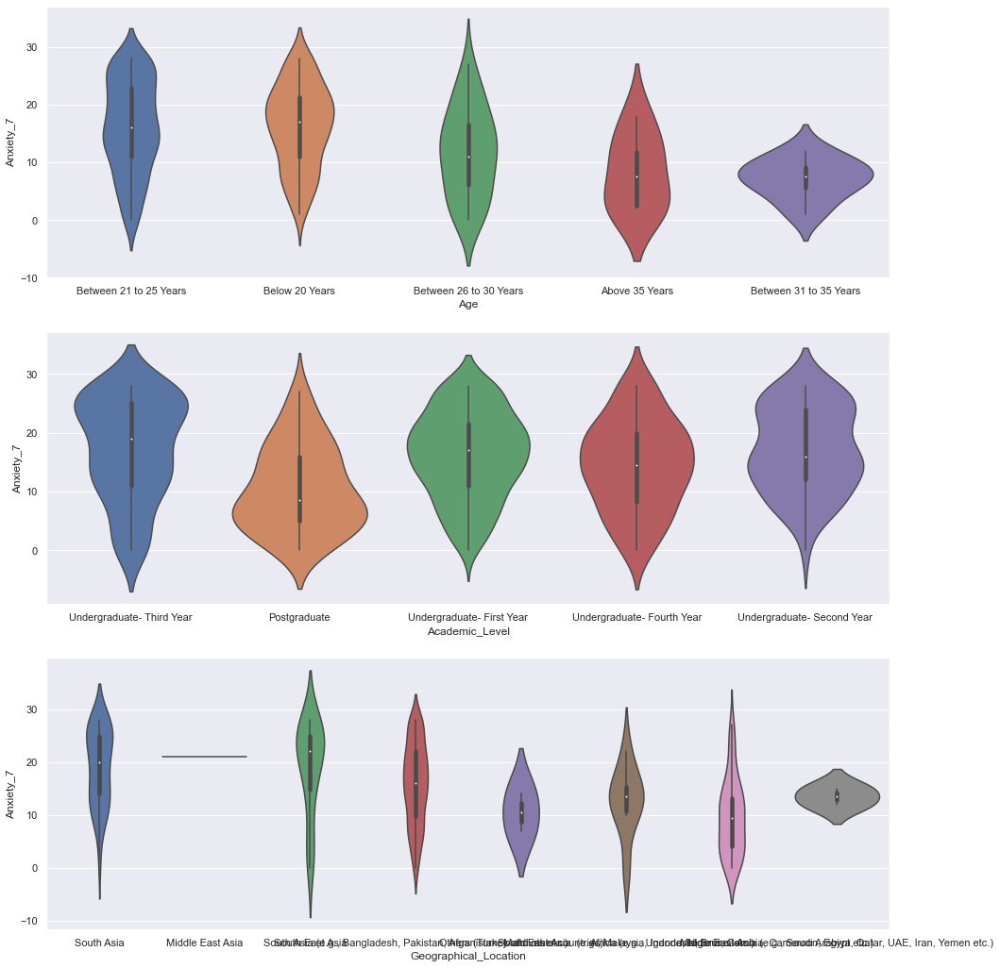

In [51]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,1, figsize=(16,18))
sns.violinplot(x='Age', y='Anxiety_7', data=df, ax=ax[0])
sns.violinplot(x='Academic_Level', y='Anxiety_7', data=df, ax=ax[1])
sns.violinplot(x='Geographical_Location', y='Anxiety_7', data=df, ax=ax[2])
plt.show()

### Depression

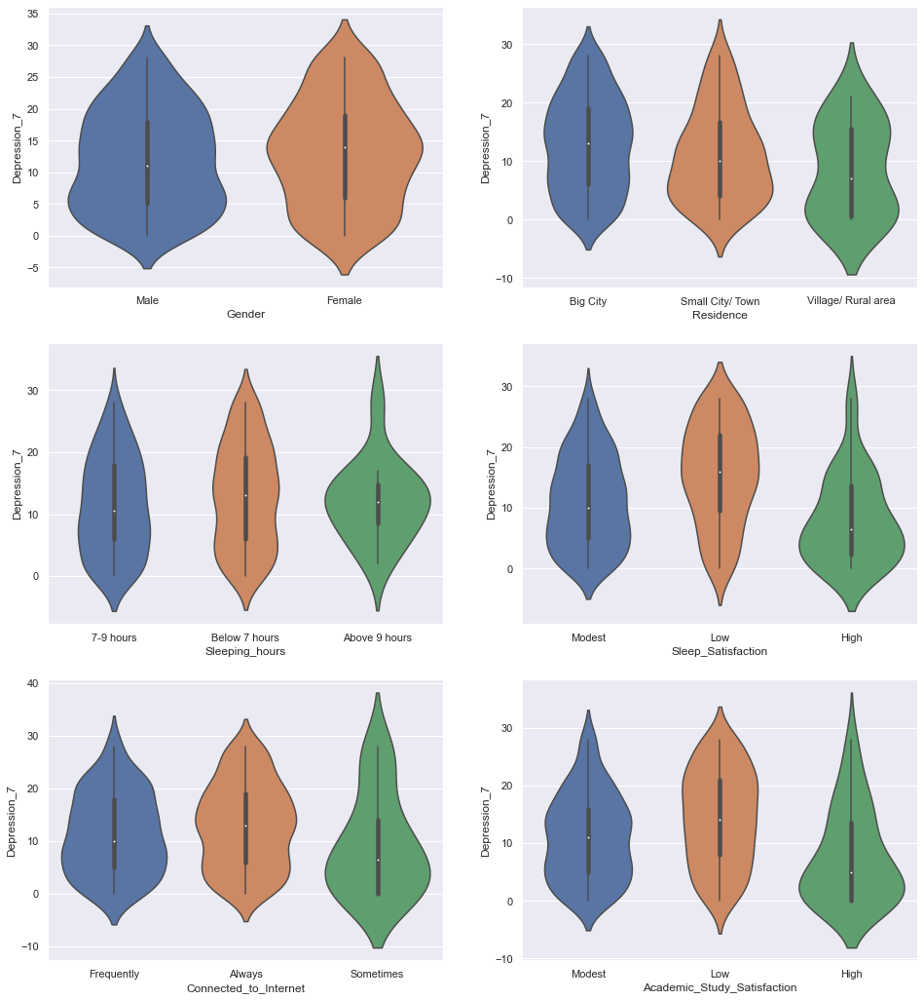

In [52]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,2, figsize=(16,18))
sns.violinplot(x='Gender', y='Depression_7', data=df, ax=ax[0,0])
sns.violinplot(x='Residence', y='Depression_7', data=df, ax=ax[0,1])
sns.violinplot(x='Sleeping_hours', y='Depression_7', data=df, ax=ax[1,0])
sns.violinplot(x='Sleep_Satisfaction', y='Depression_7', data=df, ax=ax[1,1])
sns.violinplot(x='Connected_to_Internet', y='Depression_7', data=df, ax=ax[2,0])
sns.violinplot(x='Academic_Study_Satisfaction', y='Depression_7', data=df, ax=ax[2,1])
plt.show()

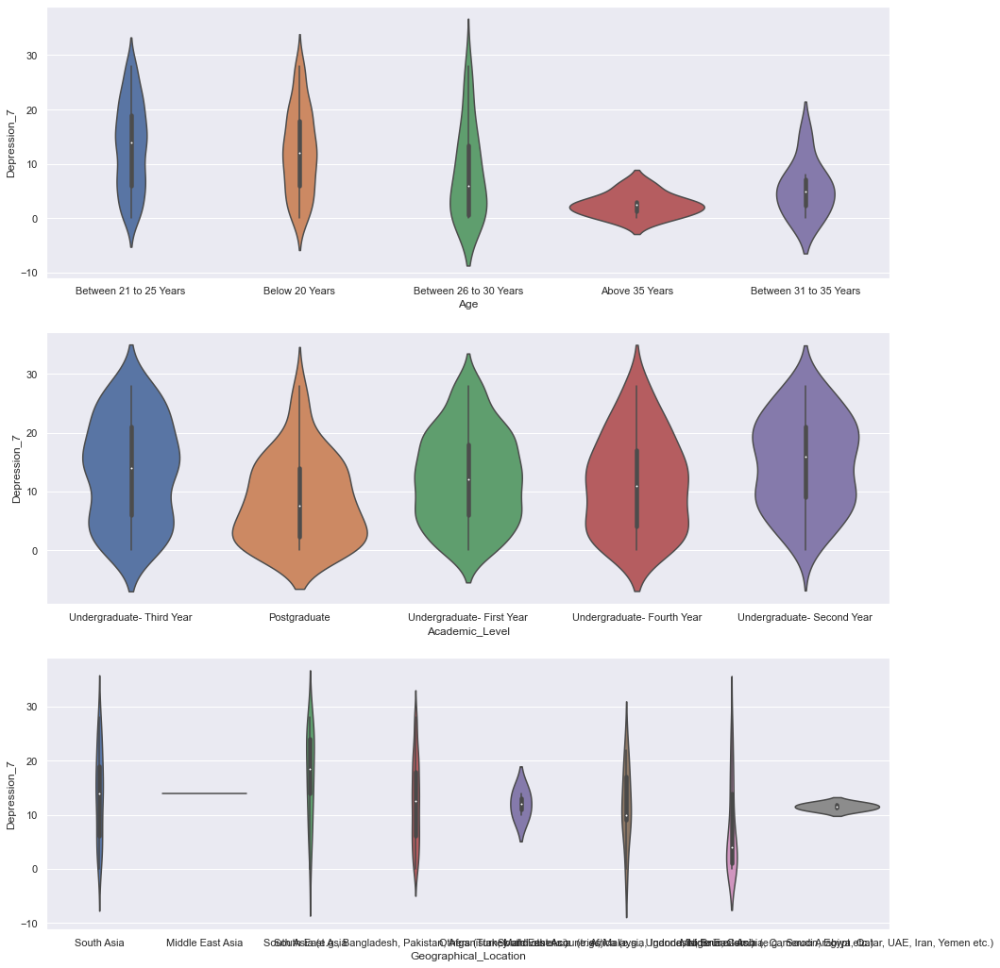

In [53]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,1, figsize=(16,18))
sns.violinplot(x='Age', y='Depression_7', data=df, ax=ax[0])
sns.violinplot(x='Academic_Level', y='Depression_7', data=df, ax=ax[1])
sns.violinplot(x='Geographical_Location', y='Depression_7', data=df, ax=ax[2])
plt.show()

### General Mental Health

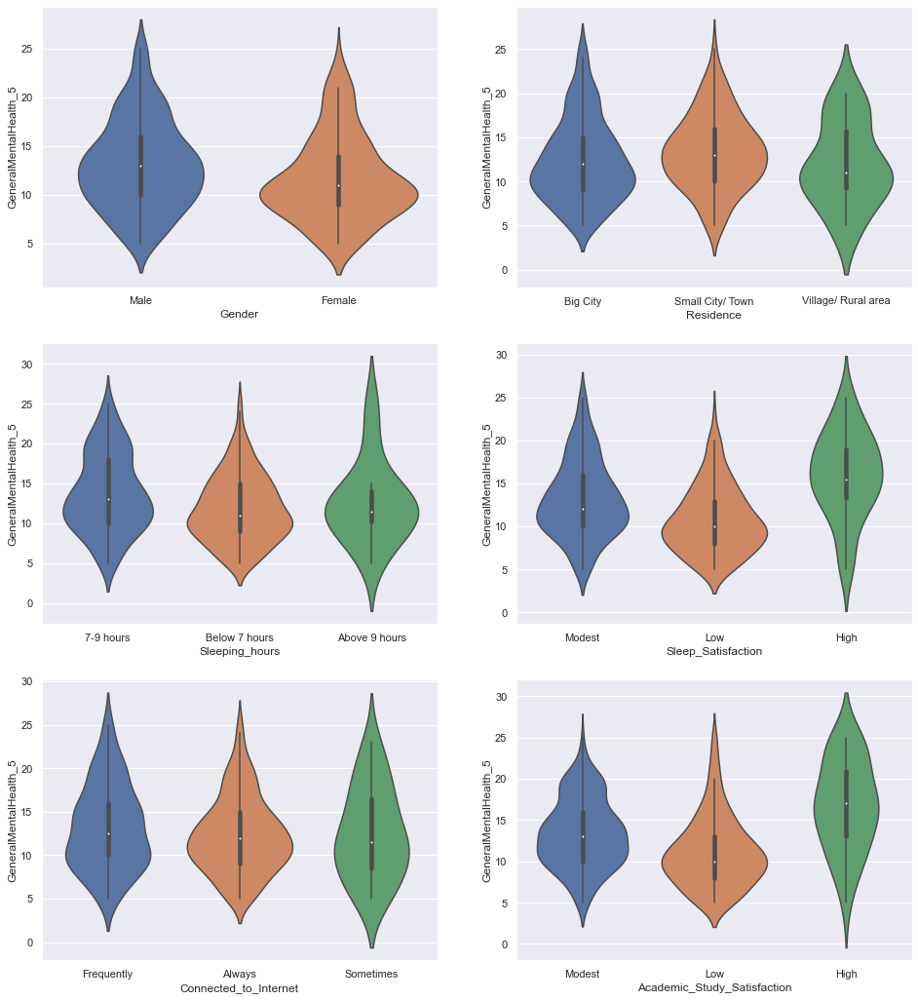

In [54]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,2, figsize=(16,18))
sns.violinplot(x='Gender', y='GeneralMentalHealth_5', data=df, ax=ax[0,0])
sns.violinplot(x='Residence', y='GeneralMentalHealth_5', data=df, ax=ax[0,1])
sns.violinplot(x='Sleeping_hours', y='GeneralMentalHealth_5', data=df, ax=ax[1,0])
sns.violinplot(x='Sleep_Satisfaction', y='GeneralMentalHealth_5', data=df, ax=ax[1,1])
sns.violinplot(x='Connected_to_Internet', y='GeneralMentalHealth_5', data=df, ax=ax[2,0])
sns.violinplot(x='Academic_Study_Satisfaction', y='GeneralMentalHealth_5', data=df, ax=ax[2,1])
plt.show()

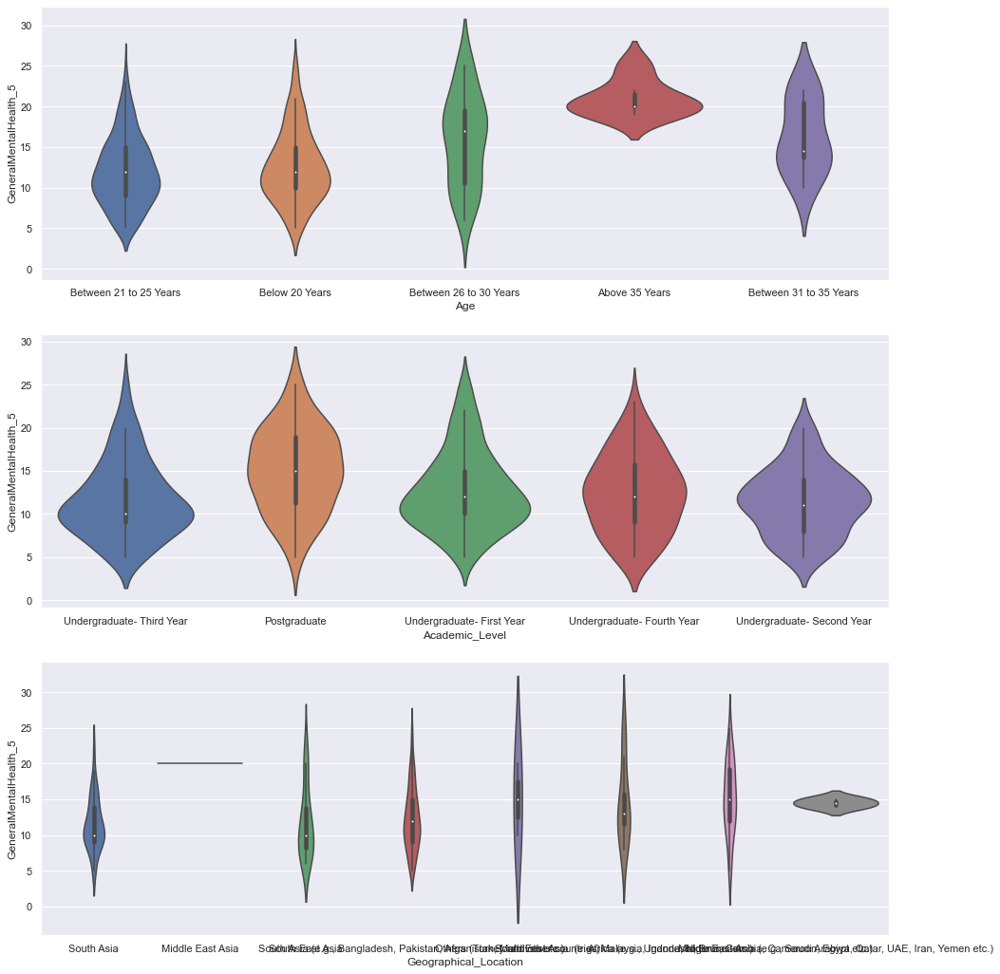

In [55]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,1, figsize=(16,18))
sns.violinplot(x='Age', y='GeneralMentalHealth_5', data=df, ax=ax[0])
sns.violinplot(x='Academic_Level', y='GeneralMentalHealth_5', data=df, ax=ax[1])
sns.violinplot(x='Geographical_Location', y='GeneralMentalHealth_5', data=df, ax=ax[2])
plt.show()

### Academic Motivation

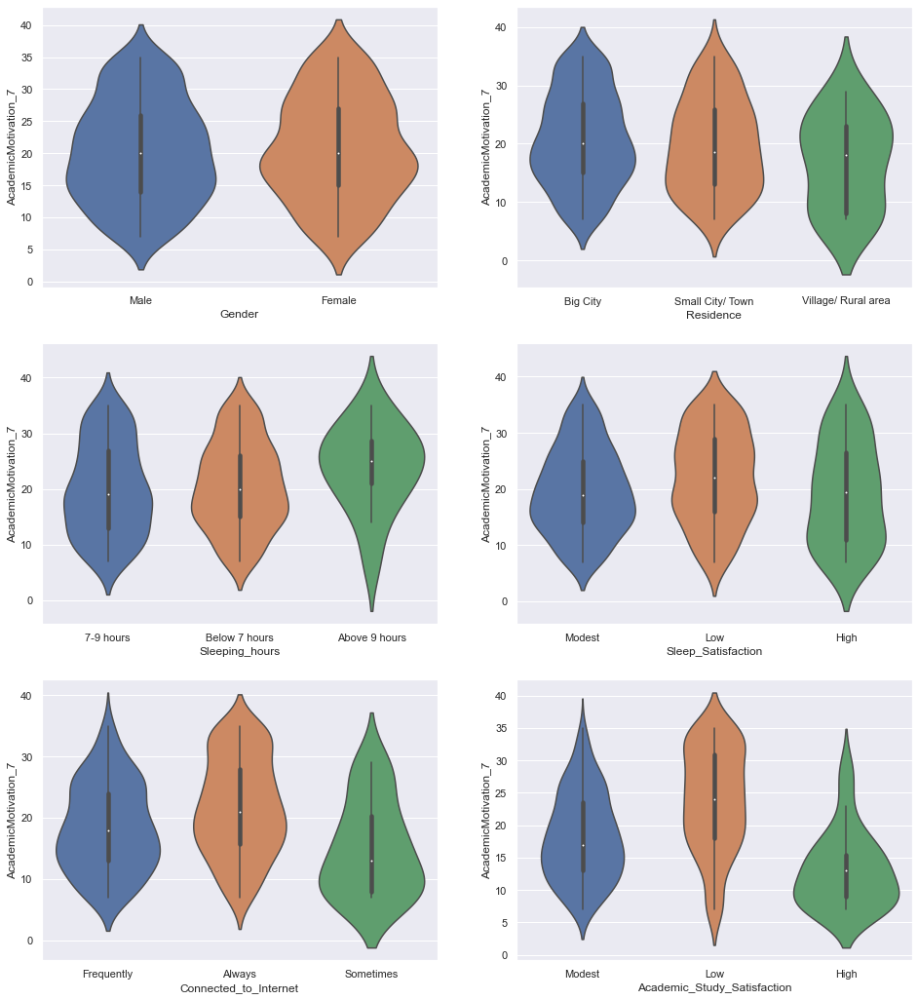

In [56]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,2, figsize=(16,18))
sns.violinplot(x='Gender', y='AcademicMotivation_7', data=df, ax=ax[0,0])
sns.violinplot(x='Residence', y='AcademicMotivation_7', data=df, ax=ax[0,1])
sns.violinplot(x='Sleeping_hours', y='AcademicMotivation_7', data=df, ax=ax[1,0])
sns.violinplot(x='Sleep_Satisfaction', y='AcademicMotivation_7', data=df, ax=ax[1,1])
sns.violinplot(x='Connected_to_Internet', y='AcademicMotivation_7', data=df, ax=ax[2,0])
sns.violinplot(x='Academic_Study_Satisfaction', y='AcademicMotivation_7', data=df, ax=ax[2,1])
plt.show()

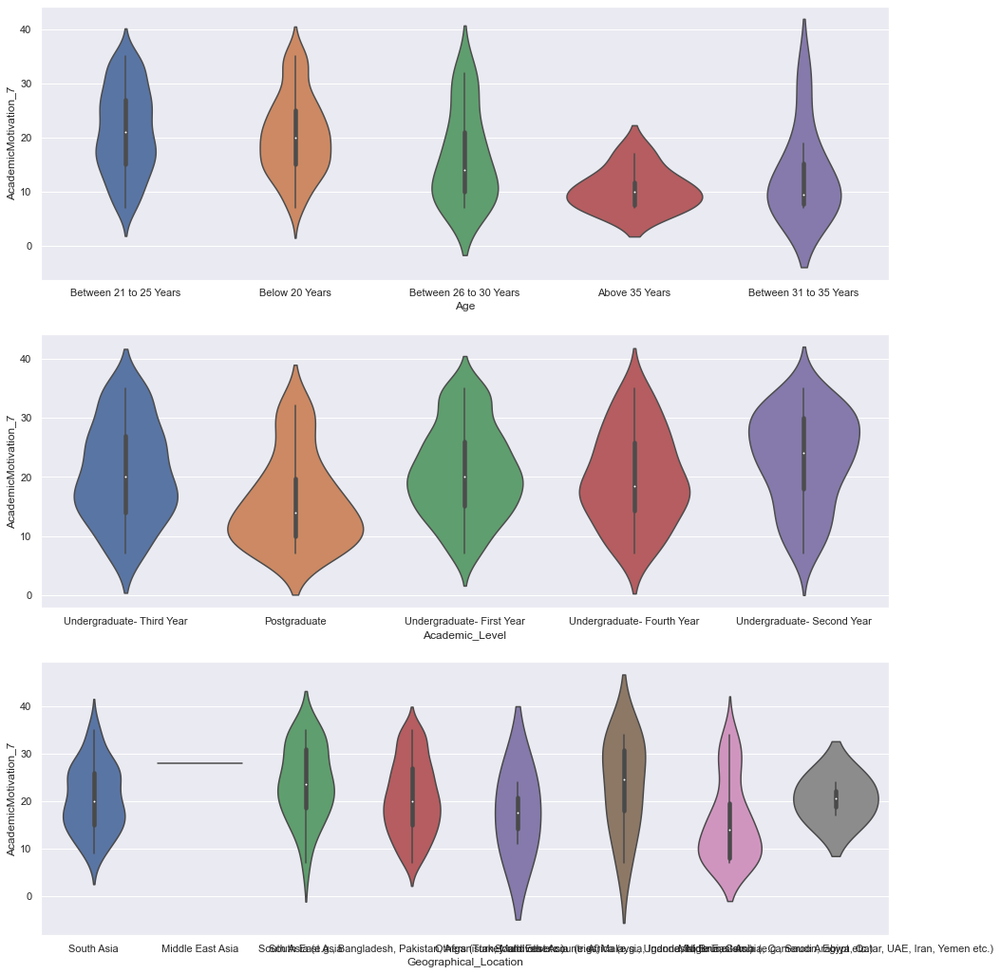

In [57]:
sns.set(style='darkgrid')
fig, ax = plt.subplots(3,1, figsize=(16,18))
sns.violinplot(x='Age', y='AcademicMotivation_7', data=df, ax=ax[0])
sns.violinplot(x='Academic_Level', y='AcademicMotivation_7', data=df, ax=ax[1])
sns.violinplot(x='Geographical_Location', y='AcademicMotivation_7', data=df, ax=ax[2])
plt.show()

## Box plot

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 444 entries, 0 to 443
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       444 non-null    object 
 1   Age                          444 non-null    object 
 2   Residence                    444 non-null    object 
 3   Sleeping_hours               444 non-null    object 
 4   Sleep_Satisfaction           444 non-null    object 
 5   Connected_to_Internet        444 non-null    object 
 6   Academic_Study_Satisfaction  444 non-null    object 
 7   Academic_Level               444 non-null    object 
 8   Geographical_Location        444 non-null    object 
 9   DS-1                         444 non-null    int64  
 10  DS-2                         444 non-null    int64  
 11  DS-3                         444 non-null    int64  
 12  DS-4                         444 non-null    int64  
 13  DS-5                

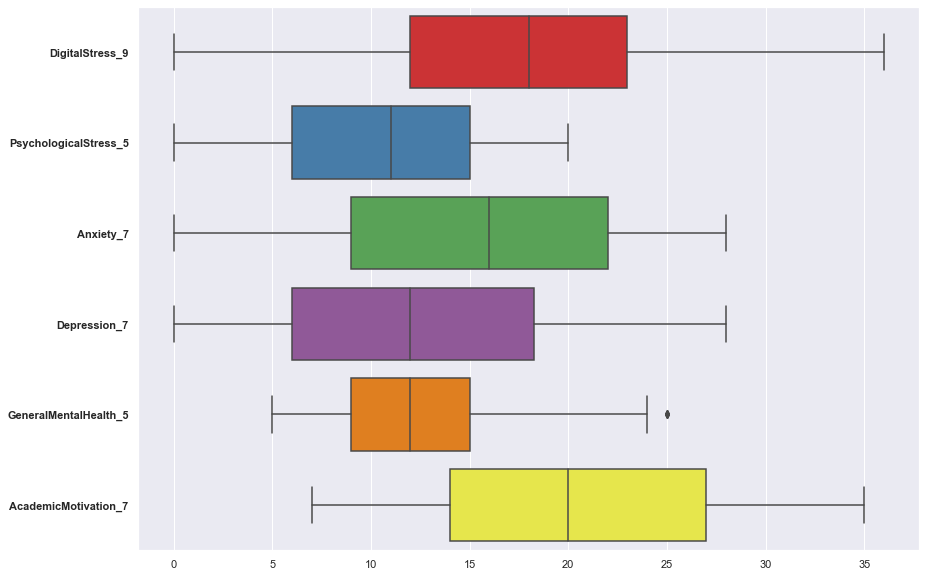

In [72]:
plt.figure(figsize=(14,10))
sns.set(style='darkgrid')
sns.boxplot(data=df[['DigitalStress_9','PsychologicalStress_5','Anxiety_7',
                    'Depression_7','GeneralMentalHealth_5', 'AcademicMotivation_7']],
             orient='h', palette='Set1')
plt.yticks(weight='bold')
plt.show()

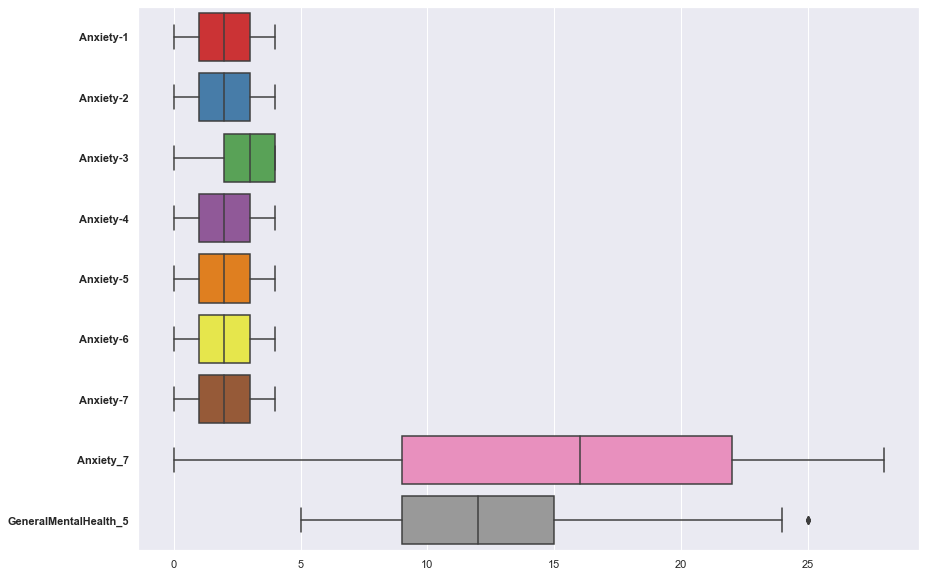

In [71]:
plt.figure(figsize=(14,10))
sns.set(style='darkgrid')
sns.boxplot(data=df[['Anxiety-1','Anxiety-2','Anxiety-3','Anxiety-4','Anxiety-5','Anxiety-6','Anxiety-7','Anxiety_7',
                     'GeneralMentalHealth_5']],
             orient='h', palette='Set1')
plt.yticks(weight='bold')
plt.show()

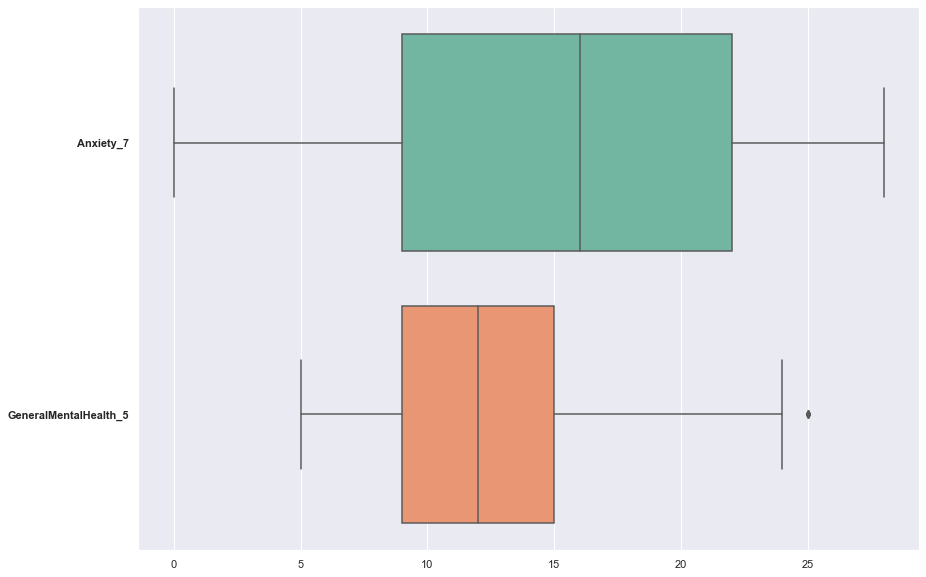

In [78]:
plt.figure(figsize=(14,10))
sns.set(style='darkgrid')
sns.boxplot(data=df[['Anxiety_7','GeneralMentalHealth_5']],
             orient='h', palette='Set2')
plt.yticks(weight='bold')
plt.show()

## Correlation Heatmap

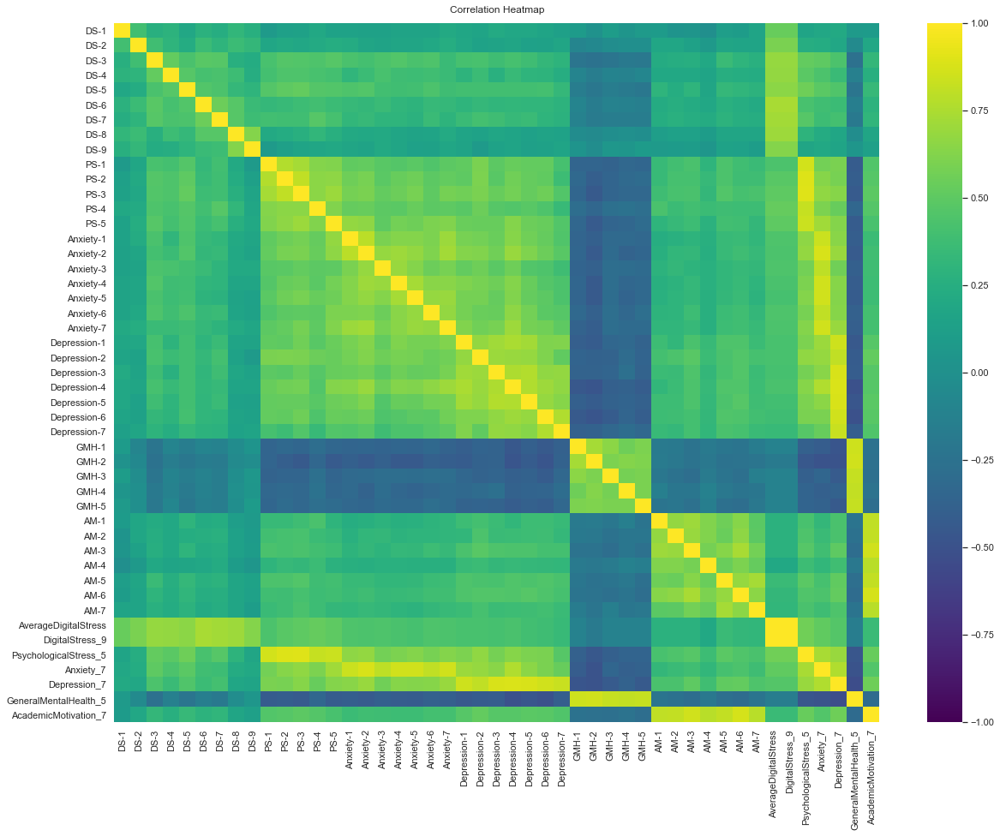

In [61]:
plt.figure(figsize=(20,15))

heatmap = sns.heatmap(df.corr(), vmin=-1,vmax=1, annot=False, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

## Pair Plot

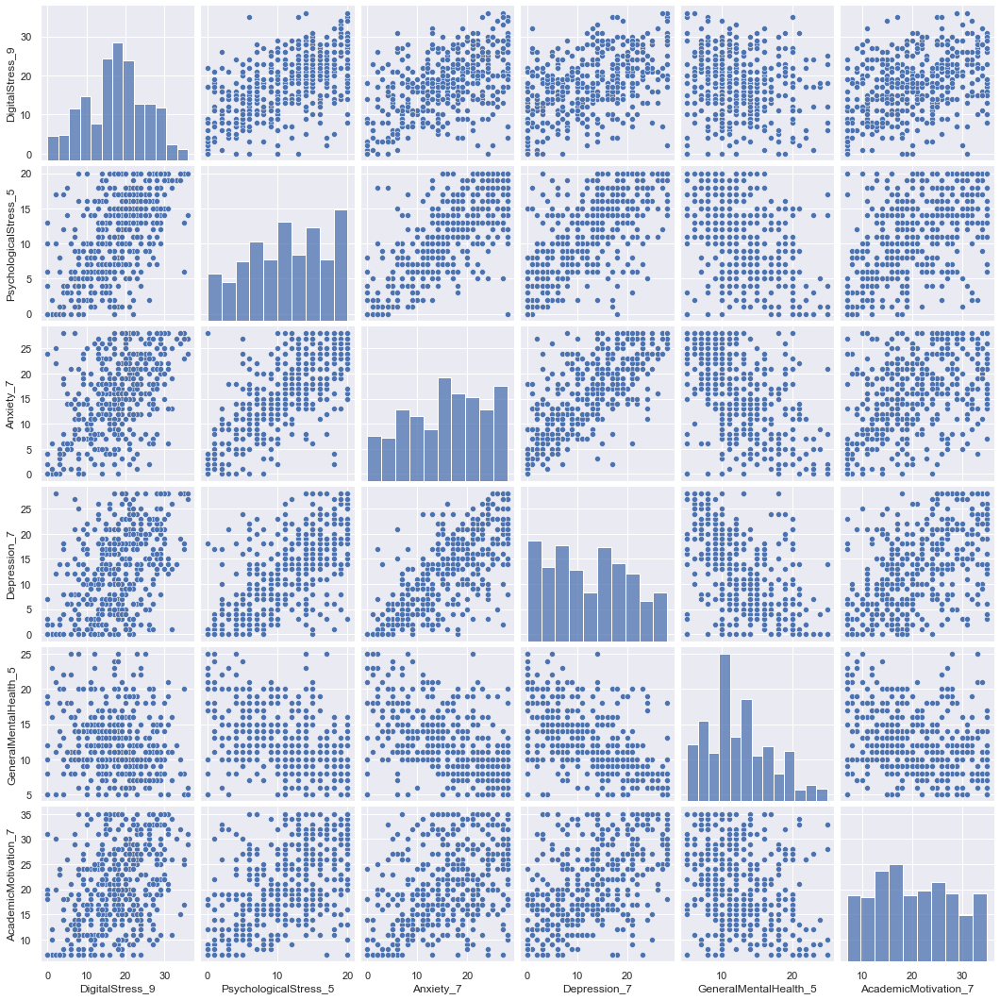

In [62]:
sns.pairplot(data=df[['DigitalStress_9','PsychologicalStress_5','Anxiety_7',
                    'Depression_7','GeneralMentalHealth_5', 'AcademicMotivation_7']])

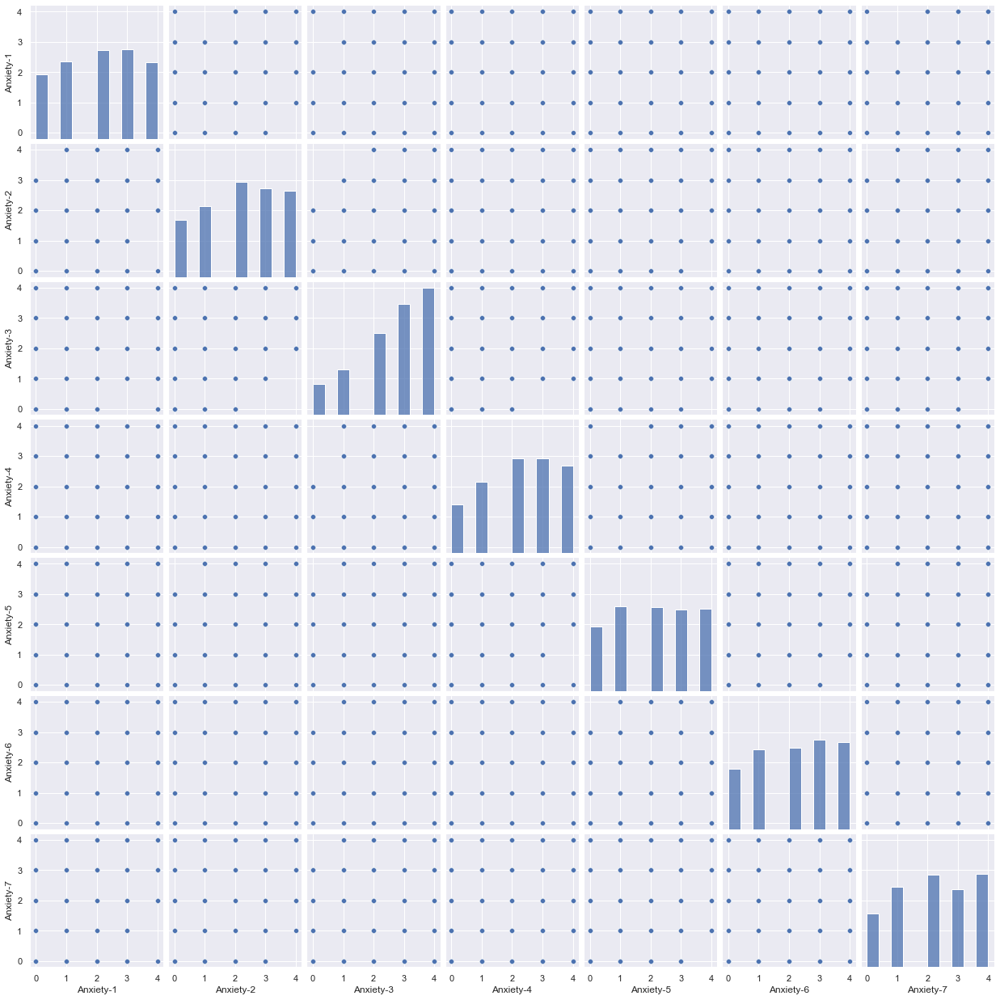

In [63]:
sns.pairplot(data=df[['Anxiety-1','Anxiety-2','Anxiety-3','Anxiety-4','Anxiety-5','Anxiety-6','Anxiety-7']])

# Outlier Detection and Removal Using IQR

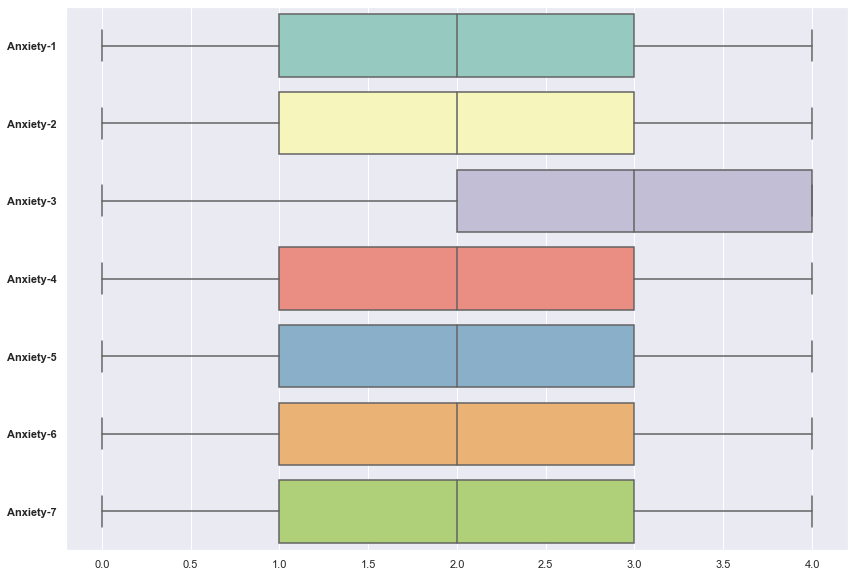

In [64]:
plt.figure(figsize=(14,10))
sns.set(style='darkgrid')
sns.boxplot(data=df[['Anxiety-1','Anxiety-2','Anxiety-3','Anxiety-4','Anxiety-5', 
                     'Anxiety-6','Anxiety-7']],
             orient='h', palette='Set3')
plt.yticks(weight='bold')
plt.show()

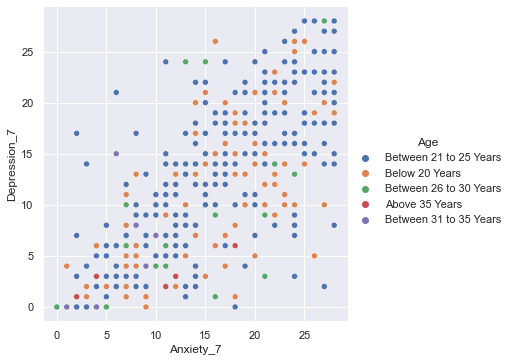

In [65]:
sns.relplot(x='Anxiety_7', y='Depression_7', hue='Age', data=df)

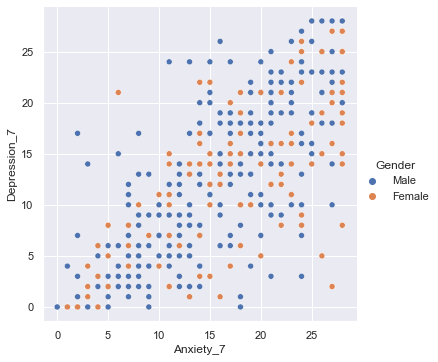

In [66]:
sns.relplot(x='Anxiety_7', y='Depression_7', hue='Gender', data=df)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Anxiety_7', ylabel='Density'>

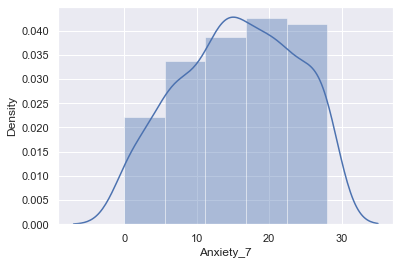

In [67]:
sns.distplot(df['Anxiety_7'], bins=5)

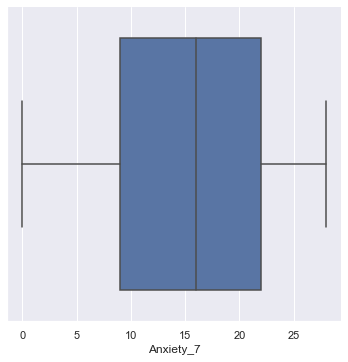

In [68]:
sns.catplot(x='Anxiety_7', kind='box', data=df)

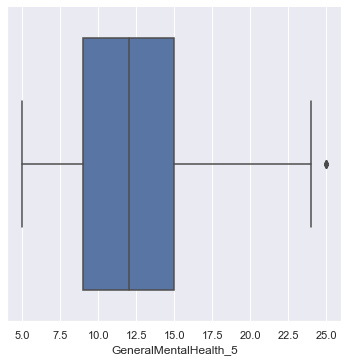

In [69]:
sns.catplot(x='GeneralMentalHealth_5', kind='box', data=df)

### We can find a value (dot) outside the upper_limit (fences) of the Inter Quertile Range (IQR), which is the only outlier of the dataset. 
### Outliers are problematic for many statistical analyses because they can cause tests to either miss significant findings or distort real results.  

In [70]:
df.describe()

,DS-1,DS-2,DS-3,DS-4,DS-5,DS-6,DS-7,DS-8,DS-9,PS-1,...,AM-5,AM-6,AM-7,AverageDigitalStress,DigitalStress_9,PsychologicalStress_5,Anxiety_7,Depression_7,GeneralMentalHealth_5,AcademicMotivation_7
count,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,...,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000,444.000000
mean,1.608108,1.752252,2.416667,2.734234,2.101351,2.029279,1.772523,1.540541,1.594595,2.004505,...,2.927928,3.065315,3.067568,1.949950,17.549550,10.855856,15.617117,12.335586,12.581081,20.373874
std,1.244229,1.176086,1.360451,1.277200,1.396900,1.317206,1.323537,1.308308,1.366338,1.301146,...,1.394680,1.451321,1.394906,0.866310,7.796786,5.726808,7.905324,8.086580,4.584319,7.966909
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,7.000000
25%,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,...,2.000000,2.000000,2.000000,1.333333,12.000000,6.000000,9.000000,6.000000,9.000000,14.000000
50%,1.000000,2.000000,3.000000,3.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,...,3.000000,3.000000,3.000000,2.000000,18.000000,11.000000,16.000000,12.000000,12.000000,20.000000
75%,2.000000,3.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,4.000000,4.000000,4.000000,2.555556,23.000000,15.000000,22.000000,18.250000,15.000000,27.000000
max,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,5.000000,5.000000,5.000000,4.000000,36.000000,20.000000,28.000000,28.000000,25.000000,35.000000


## Detect outliers using IQR

In [71]:
Q1 = df.GeneralMentalHealth_5.quantile(0.25)
Q3 = df.GeneralMentalHealth_5.quantile(0.75)
Q1, Q3

(9.0, 15.0)

In [72]:
IQR = Q3 - Q1
IQR

6.0

In [73]:
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
lower_limit, upper_limit

(0.0, 24.0)

## Here are the outliers

In [74]:
df[(df.GeneralMentalHealth_5<lower_limit)|(df.GeneralMentalHealth_5>upper_limit)]

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location,DS-1,...,AM-5,AM-6,AM-7,AverageDigitalStress,DigitalStress_9,PsychologicalStress_5,Anxiety_7,Depression_7,GeneralMentalHealth_5,AcademicMotivation_7
148,Male,Between 21 to 25 Years,Big City,7-9 hours,Modest,Frequently,Low,Undergraduate- First Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",0,...,4,5,5,2.555556,23,17,21,14,25,33
287,Male,Above 35 Years,Big City,Below 7 hours,Modest,Always,High,Undergraduate- First Year,"Africa (e.g., Uganda, Nigeria, Gambia, Cameroo...",2,...,1,1,1,1.333333,12,1,2,0,25,7
334,Male,Between 26 to 30 Years,Big City,Below 7 hours,Modest,Frequently,High,Undergraduate- Third Year,"Africa (e.g., Uganda, Nigeria, Gambia, Cameroo...",2,...,1,1,1,0.666667,6,0,1,0,25,7
352,Male,Below 20 Years,Big City,Above 9 hours,High,Always,Low,Undergraduate- First Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",2,...,1,4,5,2.777778,25,14,8,5,25,28
410,Male,Between 26 to 30 Years,Small City/ Town,7-9 hours,Modest,Always,High,Postgraduate,"South East Asia (e.g., Malaysia, Indonesia, B...",4,...,1,1,1,0.888889,8,0,0,0,25,7
443,Male,Between 26 to 30 Years,Big City,7-9 hours,High,Frequently,Modest,Postgraduate,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",1,...,2,1,1,2.000000,18,4,0,0,25,10


## Remove outliers

In [75]:
df_no_outlier = df[(df.GeneralMentalHealth_5>lower_limit)&(df.GeneralMentalHealth_5<upper_limit)]
df_no_outlier

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location,DS-1,...,AM-5,AM-6,AM-7,AverageDigitalStress,DigitalStress_9,PsychologicalStress_5,Anxiety_7,Depression_7,GeneralMentalHealth_5,AcademicMotivation_7
0,Male,Between 21 to 25 Years,Big City,7-9 hours,Modest,Frequently,Modest,Undergraduate- Third Year,South Asia,3,...,4,4,4,2.555556,23,11,17,19,19,27
1,Female,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Low,Undergraduate- Third Year,South Asia,2,...,2,3,2,1.888889,17,9,10,11,13,17
2,Female,Between 21 to 25 Years,Big City,Below 7 hours,Low,Frequently,Low,Undergraduate- Third Year,South Asia,2,...,3,3,3,1.777778,16,10,16,13,10,21
3,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Modest,Undergraduate- Third Year,Middle East Asia,3,...,4,4,4,3.000000,27,10,21,14,20,28
4,Male,Between 21 to 25 Years,Big City,7-9 hours,High,Always,High,Undergraduate- Third Year,South East Asia,0,...,1,1,1,0.111111,1,0,0,0,23,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,Male,Between 21 to 25 Years,Big City,Above 9 hours,Modest,Always,Low,Undergraduate- Second Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",1,...,5,3,4,1.333333,12,14,17,12,11,24
439,Female,Between 21 to 25 Years,Big City,7-9 hours,Modest,Always,Modest,Undergraduate- Second Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",1,...,5,5,5,2.222222,20,18,27,27,6,24
440,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Frequently,Low,Undergraduate- Second Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",4,...,3,5,4,3.888889,35,13,27,18,8,26
441,Male,Between 21 to 25 Years,Small City/ Town,Below 7 hours,Low,Always,Modest,Undergraduate- Second Year,"South Asia (e.g., Bangladesh, Pakistan, Afgani...",3,...,5,4,4,3.777778,34,20,28,28,8,32


## Find outlier for Anxiety_7 attribute

In [76]:
A1 = df.Anxiety_7.quantile(0.25)
A3 = df.Anxiety_7.quantile(0.75)
A1, A3

(9.0, 22.0)

In [77]:
IAR = A3 - A1
IAR

13.0

In [78]:
lower_lim = A1 - 1.5*IAR
upper_lim = A3 + 1.5*IAR
lower_lim, upper_lim

(-10.5, 41.5)

### Here are the outliers

In [79]:
df[(df.Anxiety_7<lower_lim)|(df.Anxiety_7>upper_lim)]

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location,DS-1,...,AM-5,AM-6,AM-7,AverageDigitalStress,DigitalStress_9,PsychologicalStress_5,Anxiety_7,Depression_7,GeneralMentalHealth_5,AcademicMotivation_7


## Data Preprocessing

In [80]:
df.columns

Index(['Gender', 'Age', 'Residence', 'Sleeping_hours', 'Sleep_Satisfaction',
       'Connected_to_Internet', 'Academic_Study_Satisfaction',
       'Academic_Level', 'Geographical_Location', 'DS-1', 'DS-2', 'DS-3',
       'DS-4', 'DS-5', 'DS-6', 'DS-7', 'DS-8', 'DS-9', 'PS-1', 'PS-2', 'PS-3',
       'PS-4', 'PS-5', 'Anxiety-1', 'Anxiety-2', 'Anxiety-3', 'Anxiety-4',
       'Anxiety-5', 'Anxiety-6', 'Anxiety-7', 'Depression-1', 'Depression-2',
       'Depression-3', 'Depression-4', 'Depression-5', 'Depression-6',
       'Depression-7', 'GMH-1', 'GMH-2', 'GMH-3', 'GMH-4', 'GMH-5', 'AM-1',
       'AM-2', 'AM-3', 'AM-4', 'AM-5', 'AM-6', 'AM-7', 'AverageDigitalStress',
       'DigitalStress_9', 'PsychologicalStress_5', 'Anxiety_7', 'Depression_7',
       'GeneralMentalHealth_5', 'AcademicMotivation_7'],
      dtype='object')

### Checking Null data

In [81]:
df.isnull().sum()

Gender                         0
Age                            0
Residence                      0
Sleeping_hours                 0
Sleep_Satisfaction             0
Connected_to_Internet          0
Academic_Study_Satisfaction    0
Academic_Level                 0
Geographical_Location          0
DS-1                           0
DS-2                           0
DS-3                           0
DS-4                           0
DS-5                           0
DS-6                           0
DS-7                           0
DS-8                           0
DS-9                           0
PS-1                           0
PS-2                           0
PS-3                           0
PS-4                           0
PS-5                           0
Anxiety-1                      0
Anxiety-2                      0
Anxiety-3                      0
Anxiety-4                      0
Anxiety-5                      0
Anxiety-6                      0
Anxiety-7                      0
Depression

### Removing Null data

In [82]:
df=df.dropna()
df.isnull().sum()

Gender                         0
Age                            0
Residence                      0
Sleeping_hours                 0
Sleep_Satisfaction             0
Connected_to_Internet          0
Academic_Study_Satisfaction    0
Academic_Level                 0
Geographical_Location          0
DS-1                           0
DS-2                           0
DS-3                           0
DS-4                           0
DS-5                           0
DS-6                           0
DS-7                           0
DS-8                           0
DS-9                           0
PS-1                           0
PS-2                           0
PS-3                           0
PS-4                           0
PS-5                           0
Anxiety-1                      0
Anxiety-2                      0
Anxiety-3                      0
Anxiety-4                      0
Anxiety-5                      0
Anxiety-6                      0
Anxiety-7                      0
Depression

### Seeing the categorical data

In [83]:
print(df['Gender'].unique())
print(df['Age'].unique())
print(df['Residence'].unique())
print(df['Sleeping_hours'].unique())
print(df['Sleep_Satisfaction'].unique())
print(df['Connected_to_Internet'].unique())
print(df['Academic_Study_Satisfaction'].unique())
print(df['Academic_Level'].unique())
print(df['Geographical_Location'].unique())

['Male' 'Female']
['Between 21 to 25 Years' 'Below 20 Years' 'Between 26 to 30 Years'
 'Above 35 Years' 'Between 31 to 35 Years']
['Big City' 'Small City/ Town' 'Village/ Rural area']
['7-9 hours' 'Below 7 hours' 'Above 9 hours']
['Modest' 'Low' 'High']
['Frequently' 'Always' 'Sometimes']
['Modest' 'Low' 'High']
['Undergraduate- Third Year' 'Postgraduate' 'Undergraduate- First Year'
 'Undergraduate- Fourth Year' 'Undergraduate- Second Year']
['South Asia' 'Middle East Asia' 'South East Asia'
 'South Asia (e.g., Bangladesh, Pakistan, Afganistan, Maldives etc.)'
 'Others (Turkey and other countries)'
 'South East Asia  (e.g., Malaysia, Indonesia, Brunei etc.)'
 'Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)'
 'Middle East Asia (e.g., Saudi Arabiya, Qatar, UAE, Iran, Yemen etc.)']


### Taking the data used to build the model

In [84]:
model_data=df[['Gender','Age','Residence','Sleeping_hours','Sleep_Satisfaction','Connected_to_Internet',
               'Academic_Study_Satisfaction','Academic_Level', 'Geographical_Location']]

In [85]:
model_data.head()

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location
0,Male,Between 21 to 25 Years,Big City,7-9 hours,Modest,Frequently,Modest,Undergraduate- Third Year,South Asia
1,Female,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Low,Undergraduate- Third Year,South Asia
2,Female,Between 21 to 25 Years,Big City,Below 7 hours,Low,Frequently,Low,Undergraduate- Third Year,South Asia
3,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Modest,Undergraduate- Third Year,Middle East Asia
4,Male,Between 21 to 25 Years,Big City,7-9 hours,High,Always,High,Undergraduate- Third Year,South East Asia


## Encoding Categorical Data

In [86]:
data_encoded=pd.get_dummies(data=model_data)
data_encoded.head()

,Gender_Female,Gender_Male,Age_Above 35 Years,Age_Below 20 Years,Age_Between 21 to 25 Years,Age_Between 26 to 30 Years,Age_Between 31 to 35 Years,Residence_Big City,Residence_Small City/ Town,Residence_Village/ Rural area,...,Academic_Level_Undergraduate- Second Year,Academic_Level_Undergraduate- Third Year,"Geographical_Location_Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)",Geographical_Location_Middle East Asia,"Geographical_Location_Middle East Asia (e.g., Saudi Arabiya, Qatar, UAE, Iran, Yemen etc.)",Geographical_Location_Others (Turkey and other countries),Geographical_Location_South Asia,"Geographical_Location_South Asia (e.g., Bangladesh, Pakistan, Afganistan, Maldives etc.)",Geographical_Location_South East Asia,"Geographical_Location_South East Asia (e.g., Malaysia, Indonesia, Brunei etc.)"
0,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
1,1,0,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
2,1,0,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
3,0,1,0,0,1,0,0,1,0,0,...,0,1,0,1,0,0,0,0,0,0
4,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0


In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444 entries, 0 to 443
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       444 non-null    object 
 1   Age                          444 non-null    object 
 2   Residence                    444 non-null    object 
 3   Sleeping_hours               444 non-null    object 
 4   Sleep_Satisfaction           444 non-null    object 
 5   Connected_to_Internet        444 non-null    object 
 6   Academic_Study_Satisfaction  444 non-null    object 
 7   Academic_Level               444 non-null    object 
 8   Geographical_Location        444 non-null    object 
 9   DS-1                         444 non-null    int64  
 10  DS-2                         444 non-null    int64  
 11  DS-3                         444 non-null    int64  
 12  DS-4                         444 non-null    int64  
 13  DS-5                

# GAD-7 Prediction

In [88]:
df.Anxiety_7.describe()

count    444.000000
mean      15.617117
std        7.905324
min        0.000000
25%        9.000000
50%       16.000000
75%       22.000000
max       28.000000
Name: Anxiety_7, dtype: float64

## Range of value [(0X7) - (4X7)] = [0 - 28]
### Not at all true - 0
### Rarely true - 1
### Often true - 2
### Usually true - 3
### Always true - 4
## GAD-7 scoring and implementation of our dataset
### Normal[0-11]       -   0                      
### Mild[12-16]            -   1                  
### Moderate[17-21]   -   2                  
### Severe[22+]       -   3                  

In [89]:
df['Anxiety_7'].replace([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28], 
                        [0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,2,2,2,2,3,3,3,3,3,3,3], inplace=True)

In [90]:
df.head()

,Gender,Age,Residence,Sleeping_hours,Sleep_Satisfaction,Connected_to_Internet,Academic_Study_Satisfaction,Academic_Level,Geographical_Location,DS-1,...,AM-5,AM-6,AM-7,AverageDigitalStress,DigitalStress_9,PsychologicalStress_5,Anxiety_7,Depression_7,GeneralMentalHealth_5,AcademicMotivation_7
0,Male,Between 21 to 25 Years,Big City,7-9 hours,Modest,Frequently,Modest,Undergraduate- Third Year,South Asia,3,...,4,4,4,2.555556,23,11,2,19,19,27
1,Female,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Low,Undergraduate- Third Year,South Asia,2,...,2,3,2,1.888889,17,9,0,11,13,17
2,Female,Between 21 to 25 Years,Big City,Below 7 hours,Low,Frequently,Low,Undergraduate- Third Year,South Asia,2,...,3,3,3,1.777778,16,10,1,13,10,21
3,Male,Between 21 to 25 Years,Big City,Below 7 hours,Modest,Always,Modest,Undergraduate- Third Year,Middle East Asia,3,...,4,4,4,3.000000,27,10,2,14,20,28
4,Male,Between 21 to 25 Years,Big City,7-9 hours,High,Always,High,Undergraduate- Third Year,South East Asia,0,...,1,1,1,0.111111,1,0,0,0,23,7


In [91]:
df.Anxiety_7.describe()

count    444.000000
mean       1.421171
std        1.183255
min        0.000000
25%        0.000000
50%        1.000000
75%        3.000000
max        3.000000
Name: Anxiety_7, dtype: float64

## Introducing input variable 'X'

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444 entries, 0 to 443
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Gender                       444 non-null    object 
 1   Age                          444 non-null    object 
 2   Residence                    444 non-null    object 
 3   Sleeping_hours               444 non-null    object 
 4   Sleep_Satisfaction           444 non-null    object 
 5   Connected_to_Internet        444 non-null    object 
 6   Academic_Study_Satisfaction  444 non-null    object 
 7   Academic_Level               444 non-null    object 
 8   Geographical_Location        444 non-null    object 
 9   DS-1                         444 non-null    int64  
 10  DS-2                         444 non-null    int64  
 11  DS-3                         444 non-null    int64  
 12  DS-4                         444 non-null    int64  
 13  DS-5                

In [93]:
a=df[['Anxiety-1','Anxiety-2','Anxiety-3','Anxiety-4','Anxiety-5','Anxiety-6','Anxiety-7']]

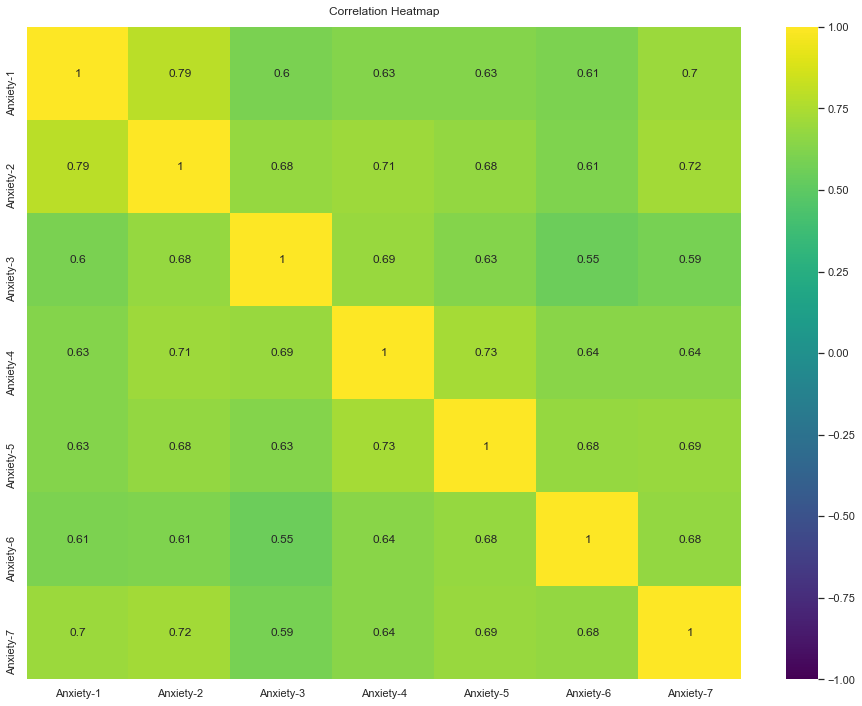

In [94]:
plt.figure(figsize=(16,12))

heatmap = sns.heatmap(a.corr(), vmin=-1,vmax=1, annot=True, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

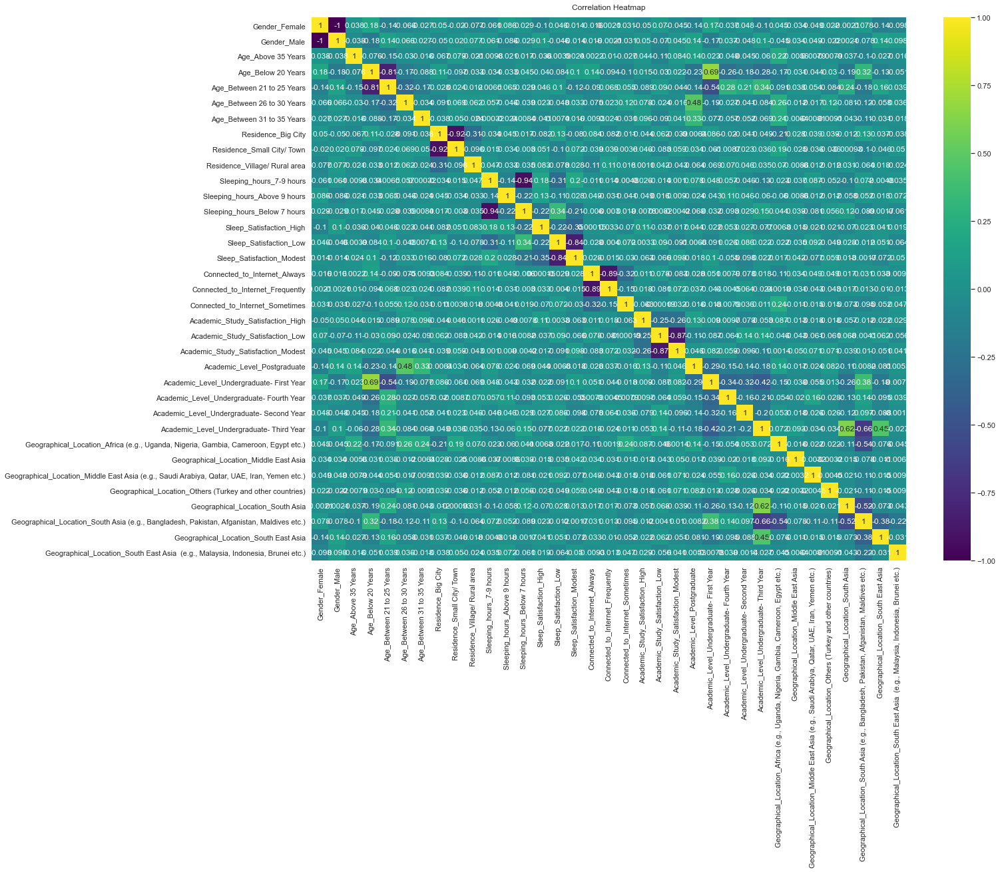

In [95]:
plt.figure(figsize=(20,15))

heatmap = sns.heatmap(data_encoded.corr(), vmin=-1,vmax=1, annot=True, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

In [96]:
x = pd.concat([data_encoded,a], axis=1)
x

,Gender_Female,Gender_Male,Age_Above 35 Years,Age_Below 20 Years,Age_Between 21 to 25 Years,Age_Between 26 to 30 Years,Age_Between 31 to 35 Years,Residence_Big City,Residence_Small City/ Town,Residence_Village/ Rural area,...,"Geographical_Location_South Asia (e.g., Bangladesh, Pakistan, Afganistan, Maldives etc.)",Geographical_Location_South East Asia,"Geographical_Location_South East Asia (e.g., Malaysia, Indonesia, Brunei etc.)",Anxiety-1,Anxiety-2,Anxiety-3,Anxiety-4,Anxiety-5,Anxiety-6,Anxiety-7
0,0,1,0,0,1,0,0,1,0,0,...,0,0,0,2,3,3,2,3,2,2
1,1,0,0,0,1,0,0,1,0,0,...,0,0,0,1,2,1,2,1,2,1
2,1,0,0,0,1,0,0,1,0,0,...,0,0,0,3,2,2,3,2,2,2
3,0,1,0,0,1,0,0,1,0,0,...,0,0,0,3,3,3,3,3,3,3
4,0,1,0,0,1,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,1,0,0,0,1,0,0,1,0,0,...,1,0,0,3,4,4,4,4,4,4
440,0,1,0,0,1,0,0,1,0,0,...,1,0,0,4,4,4,3,4,4,4
441,0,1,0,0,1,0,0,0,1,0,...,1,0,0,4,4,4,4,4,4,4
442,1,0,0,0,1,0,0,0,1,0,...,0,0,0,2,1,2,2,1,2,1


In [97]:
x.dtypes

Gender_Female                                                                                 uint8
Gender_Male                                                                                   uint8
Age_Above 35 Years                                                                            uint8
Age_Below 20 Years                                                                            uint8
Age_Between 21 to 25 Years                                                                    uint8
Age_Between 26 to 30 Years                                                                    uint8
Age_Between 31 to 35 Years                                                                    uint8
Residence_Big City                                                                            uint8
Residence_Small City/ Town                                                                    uint8
Residence_Village/ Rural area                                                                 uint8


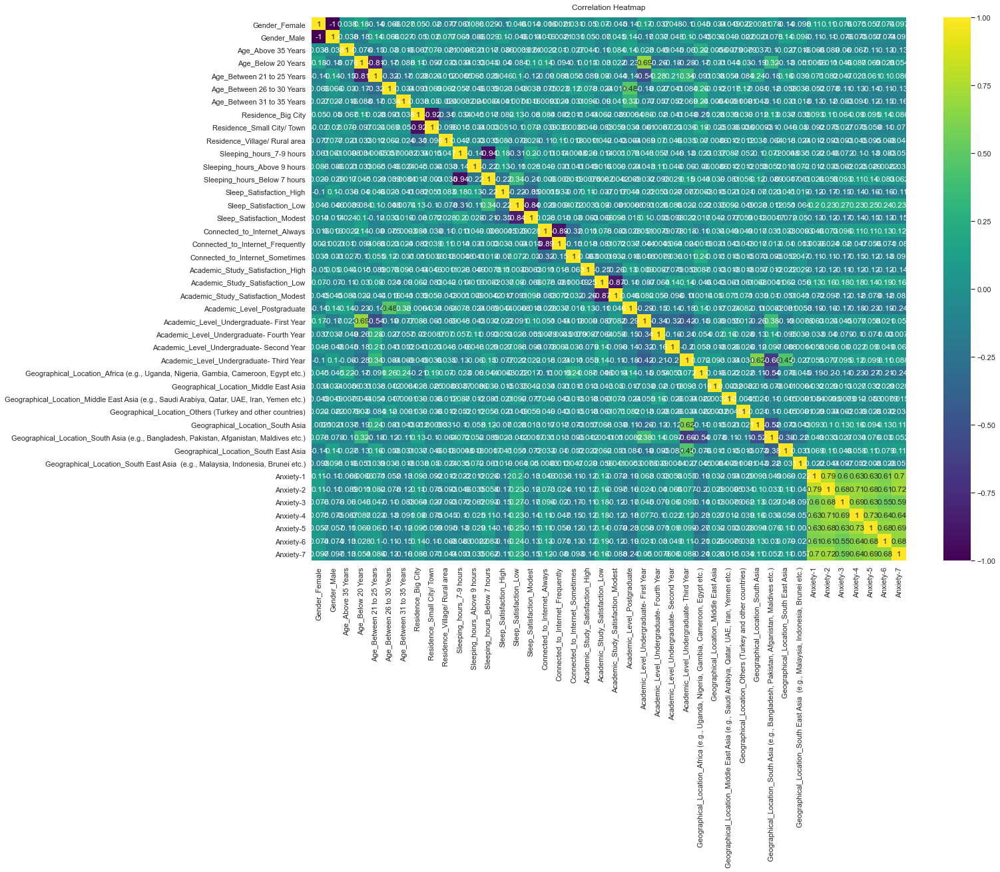

In [98]:
plt.figure(figsize=(20,15))

heatmap = sns.heatmap(x.corr(), vmin=-1,vmax=1, annot=True, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

## Encoding Output variable 'Y'

In [122]:
Y = df['Anxiety_7']
Y = pd.DataFrame(Y)
Y

,Anxiety_7
0,2
1,0
2,1
3,2
4,0
...,...
439,3
440,3
441,3
442,0


## GAD-7 scoring and implementation of our dataset
### Normal[0-11]       -   0                      
### Mild[12-16]            -   1                  
### Moderate[17-21]   -   2                  
### Severe[22+]       -   3  

In [123]:
yo = pd.concat([a,Y], axis=1)
yo

,Anxiety-1,Anxiety-2,Anxiety-3,Anxiety-4,Anxiety-5,Anxiety-6,Anxiety-7,Anxiety_7
0,2,3,3,2,3,2,2,2
1,1,2,1,2,1,2,1,0
2,3,2,2,3,2,2,2,1
3,3,3,3,3,3,3,3,2
4,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
439,3,4,4,4,4,4,4,3
440,4,4,4,3,4,4,4,3
441,4,4,4,4,4,4,4,3
442,2,1,2,2,1,2,1,0


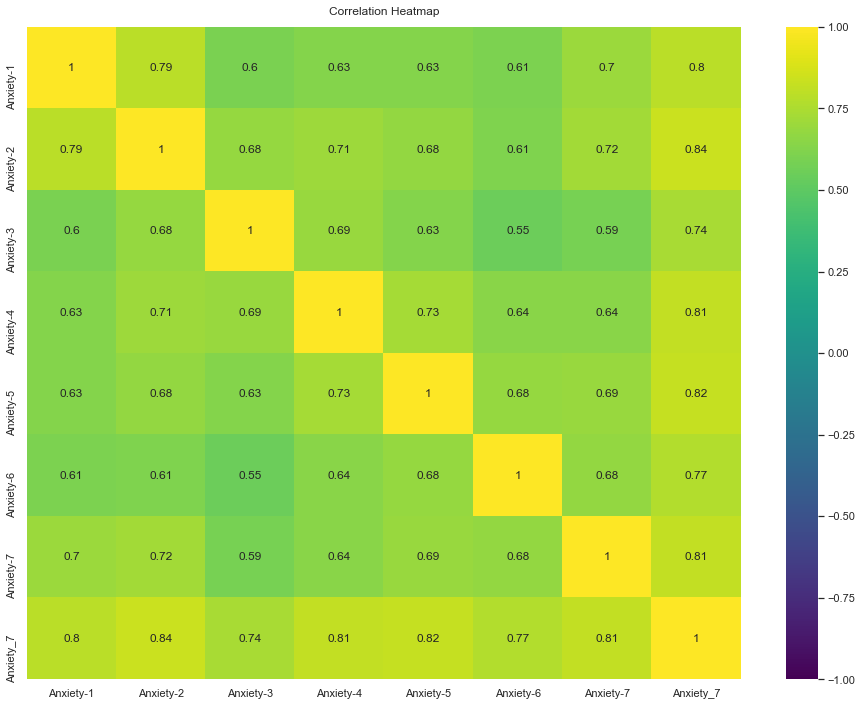

In [124]:
plt.figure(figsize=(16,12))

heatmap = sns.heatmap(yo.corr(), vmin=-1,vmax=1, annot=True, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

In [125]:
po = pd.concat([data_encoded,Y], axis=1)
po

,Gender_Female,Gender_Male,Age_Above 35 Years,Age_Below 20 Years,Age_Between 21 to 25 Years,Age_Between 26 to 30 Years,Age_Between 31 to 35 Years,Residence_Big City,Residence_Small City/ Town,Residence_Village/ Rural area,...,Academic_Level_Undergraduate- Third Year,"Geographical_Location_Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)",Geographical_Location_Middle East Asia,"Geographical_Location_Middle East Asia (e.g., Saudi Arabiya, Qatar, UAE, Iran, Yemen etc.)",Geographical_Location_Others (Turkey and other countries),Geographical_Location_South Asia,"Geographical_Location_South Asia (e.g., Bangladesh, Pakistan, Afganistan, Maldives etc.)",Geographical_Location_South East Asia,"Geographical_Location_South East Asia (e.g., Malaysia, Indonesia, Brunei etc.)",Anxiety_7
0,0,1,0,0,1,0,0,1,0,0,...,1,0,0,0,0,1,0,0,0,2
1,1,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,1,0,0,0,0
2,1,0,0,0,1,0,0,1,0,0,...,1,0,0,0,0,1,0,0,0,1
3,0,1,0,0,1,0,0,1,0,0,...,1,0,1,0,0,0,0,0,0,2
4,0,1,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,1,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,3
440,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,3
441,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,3
442,1,0,0,0,1,0,0,0,1,0,...,1,1,0,0,0,0,0,0,0,0


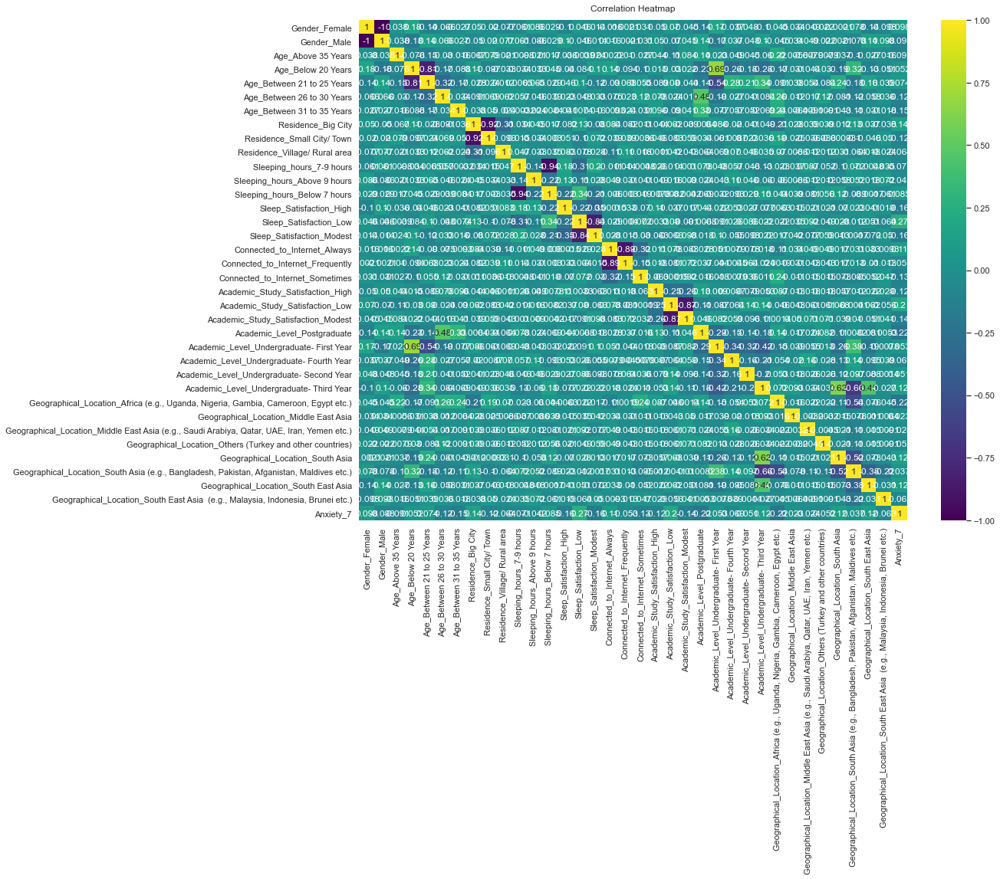

In [126]:
plt.figure(figsize=(16,12))

heatmap = sns.heatmap(po.corr(), vmin=-1,vmax=1, annot=True, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

In [127]:
no = pd.concat([x,Y], axis=1)
no

,Gender_Female,Gender_Male,Age_Above 35 Years,Age_Below 20 Years,Age_Between 21 to 25 Years,Age_Between 26 to 30 Years,Age_Between 31 to 35 Years,Residence_Big City,Residence_Small City/ Town,Residence_Village/ Rural area,...,Geographical_Location_South East Asia,"Geographical_Location_South East Asia (e.g., Malaysia, Indonesia, Brunei etc.)",Anxiety-1,Anxiety-2,Anxiety-3,Anxiety-4,Anxiety-5,Anxiety-6,Anxiety-7,Anxiety_7
0,0,1,0,0,1,0,0,1,0,0,...,0,0,2,3,3,2,3,2,2,2
1,1,0,0,0,1,0,0,1,0,0,...,0,0,1,2,1,2,1,2,1,0
2,1,0,0,0,1,0,0,1,0,0,...,0,0,3,2,2,3,2,2,2,1
3,0,1,0,0,1,0,0,1,0,0,...,0,0,3,3,3,3,3,3,3,2
4,0,1,0,0,1,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,1,0,0,0,1,0,0,1,0,0,...,0,0,3,4,4,4,4,4,4,3
440,0,1,0,0,1,0,0,1,0,0,...,0,0,4,4,4,3,4,4,4,3
441,0,1,0,0,1,0,0,0,1,0,...,0,0,4,4,4,4,4,4,4,3
442,1,0,0,0,1,0,0,0,1,0,...,0,0,2,1,2,2,1,2,1,0


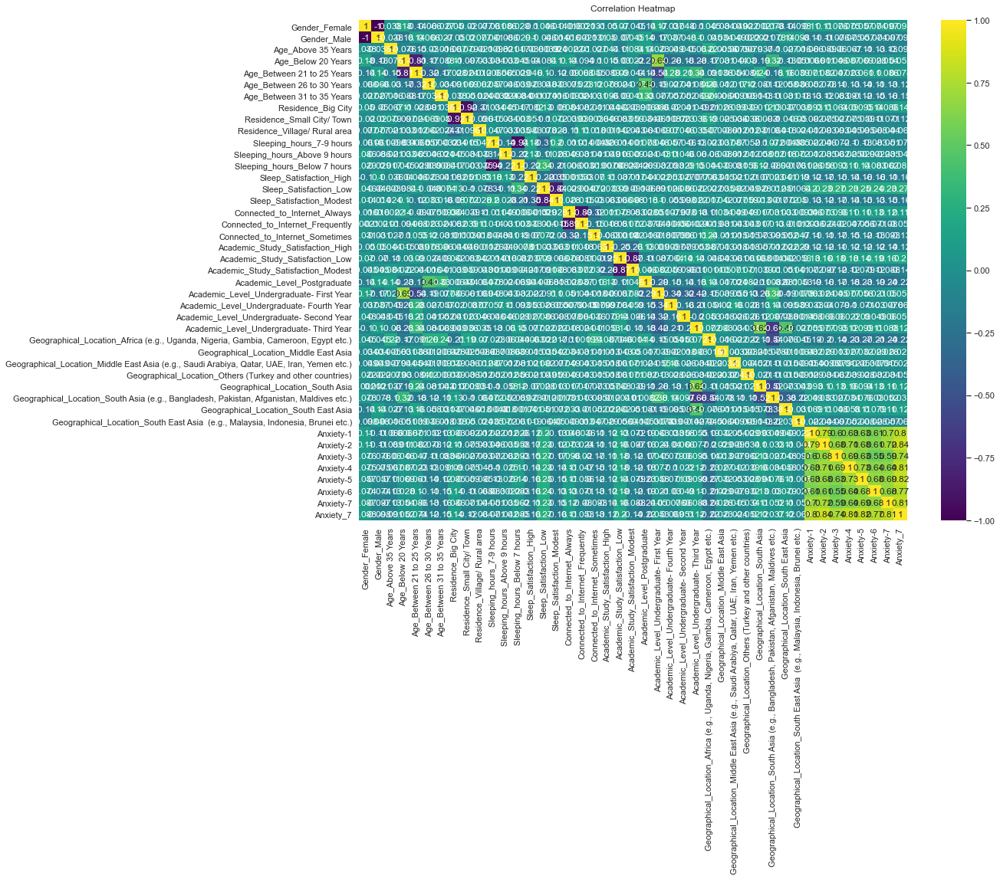

In [128]:
plt.figure(figsize=(16,12))

heatmap = sns.heatmap(no.corr(), vmin=-1,vmax=1, annot=True, cmap='viridis')

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)
plt.show()

# Feature Selection

### Apply SelectKBest class to extract top 10 best features

In [266]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [286]:
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(x,Y)

In [287]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [288]:
#concat two dataframes for better visualization
FeatureScores = pd.concat([dfcolumns,dfscores],axis=1)
FeatureScores.columns = ['Specs','Score'] #naming the dataframe columns

In [289]:
FeatureScores

,Specs,Score
0,Gender_Female,5.647143
1,Gender_Male,2.969117
2,Age_Above 35 Years,4.093167
3,Age_Below 20 Years,4.131787
4,Age_Between 21 to 25 Years,2.039101
5,Age_Between 26 to 30 Years,6.479377
6,Age_Between 31 to 35 Years,12.142873
7,Residence_Big City,2.290826
8,Residence_Small City/ Town,4.898135
9,Residence_Village/ Rural area,2.688018


In [290]:
print(FeatureScores.nlargest(10,'Score')) #print 10 best features

                                                Specs       Score
39                                          Anxiety-5  276.488605
36                                          Anxiety-2  257.732321
35                                          Anxiety-1  247.969528
41                                          Anxiety-7  246.882288
40                                          Anxiety-6  232.897798
38                                          Anxiety-4  227.512398
37                                          Anxiety-3  150.378242
27  Geographical_Location_Africa (e.g., Uganda, Ni...   21.801297
14                             Sleep_Satisfaction_Low   21.615408
22                        Academic_Level_Postgraduate   20.932827


In [291]:
print(df['Geographical_Location'].unique())

['South Asia' 'Middle East Asia' 'South East Asia'
 'South Asia (e.g., Bangladesh, Pakistan, Afganistan, Maldives etc.)'
 'Others (Turkey and other countries)'
 'South East Asia  (e.g., Malaysia, Indonesia, Brunei etc.)'
 'Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)'
 'Middle East Asia (e.g., Saudi Arabiya, Qatar, UAE, Iran, Yemen etc.)']


In [952]:
### Considering top 5 features
#X=x[['Anxiety-5','Anxiety-2','Anxiety-1','Anxiety-7','Anxiety-6']]

In [935]:
### Considering top 10 features
X=x[['Anxiety-5','Anxiety-2','Anxiety-1','Anxiety-7','Anxiety-6','Anxiety-4','Anxiety-3','Sleep_Satisfaction_Low',
     'Geographical_Location_Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)',
     'Academic_Level_Postgraduate']]

In [918]:
### Considering top 20 features
#X=x[['Anxiety-5','Anxiety-2','Anxiety-1','Anxiety-7','Anxiety-6','Anxiety-4','Anxiety-3','Sleep_Satisfaction_Low',
#     'Geographical_Location_Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)',
#     'Academic_Level_Postgraduate','Connected_to_Internet_Sometimes','Sleep_Satisfaction_High','Age_Between 31 to 35 Years',
#     'Academic_Level_Undergraduate- Third Year','Academic_Study_Satisfaction_Low','Geographical_Location_South Asia',
#     'Geographical_Location_South East Asia','Geographical_Location_Middle East Asia (e.g., Saudi Arabiya, Qatar, UAE, Iran, Yemen etc.)',
#     'Sleep_Satisfaction_Modest','Age_Between 26 to 30 Years']]

In [756]:
### Considering top 30 features
#X=x[['Anxiety-5','Anxiety-2','Anxiety-1','Anxiety-7','Anxiety-6','Anxiety-4','Anxiety-3','Sleep_Satisfaction_Low',
#     'Geographical_Location_Africa (e.g., Uganda, Nigeria, Gambia, Cameroon, Egypt etc.)',
#     'Academic_Level_Postgraduate','Connected_to_Internet_Sometimes','Sleep_Satisfaction_High','Age_Between 31 to 35 Years',
#     'Academic_Level_Undergraduate- Third Year','Academic_Study_Satisfaction_Low','Geographical_Location_South Asia',
#     'Geographical_Location_South East Asia','Geographical_Location_Middle East Asia (e.g., Saudi Arabiya, Qatar, UAE, Iran, Yemen etc.)',
#     'Sleep_Satisfaction_Modest','Age_Between 26 to 30 Years','Academic_Study_Satisfaction_High','Gender_Female',
#     'Geographical_Location_South East Asia  (e.g., Malaysia, Indonesia, Brunei etc.)','Academic_Study_Satisfaction_Modest',
#     'Residence_Small City/ Town','Age_Below 20 Years','Age_Above 35 Years','Academic_Level_Undergraduate- First Year',
#     'Geographical_Location_Middle East Asia','Sleeping_hours_Above 9 hours']]

## Splitting the dataset into training set and test set

In [953]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)

## Feature Scaling

In [954]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

In [955]:
z = pd.DataFrame(X_train)
z

,0,1,2,3,4
0,-0.808283,-0.119225,-0.816915,-0.137636,-0.116889
1,-0.808283,-0.119225,-0.816915,-0.877953,-0.844880
2,-1.538411,-1.604315,-1.554842,-1.618269,-1.572871
3,-0.078155,-0.119225,-0.078989,-0.137636,-0.116889
4,-0.078155,0.623319,-0.078989,1.342996,0.611102
...,...,...,...,...,...
350,-0.078155,-0.119225,-0.078989,-0.137636,-0.116889
351,0.651974,-0.119225,-0.078989,-0.137636,-0.116889
352,1.382102,-0.119225,0.658937,1.342996,1.339094
353,1.382102,1.365864,1.396863,1.342996,1.339094


## Logistic Regression Classifier

In [956]:
from sklearn.linear_model import LogisticRegression
LR_classifier = LogisticRegression(random_state = 0)
LR_classifier.fit(X_train, Y_train)
Y_pred_LR = LR_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [940]:
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score, classification_report, accuracy_score, recall_score, precision_score, f1_score
cm_LR = confusion_matrix(Y_test, Y_pred_LR)

In [762]:
cm_LR

array([[29,  1,  0,  0],
       [ 0, 15,  2,  0],
       [ 0,  1, 17,  0],
       [ 0,  0,  1, 23]], dtype=int64)

In [763]:
TP0_LR = cm_LR[0, 0]
TP1_LR = cm_LR[1, 1]
TP2_LR = cm_LR[2, 2]
TP3_LR = cm_LR[3, 3]

FP0_LR = cm_LR[1, 0] + cm_LR[2, 0] + cm_LR[3, 0]
FP1_LR = cm_LR[0, 1] + cm_LR[2, 1] + cm_LR[3, 1]
FP2_LR = cm_LR[0, 2] + cm_LR[1, 2] + cm_LR[3, 2]
FP3_LR = cm_LR[0, 3] + cm_LR[1, 3] + cm_LR[2, 3]

TN0_LR = cm_LR[1, 1] + cm_LR[1, 2] + cm_LR[1, 3] + cm_LR[2, 1] + cm_LR[2, 2] + cm_LR[2, 3] + cm_LR[3, 1] + cm_LR[3, 2] + cm_LR[3, 3]
TN1_LR = cm_LR[0, 0] + cm_LR[0, 2] + cm_LR[0, 3] + cm_LR[2, 0] + cm_LR[2, 2] + cm_LR[2, 3] + cm_LR[3, 0] + cm_LR[3, 2] + cm_LR[3, 3]
TN2_LR = cm_LR[0, 0] + cm_LR[0, 1] + cm_LR[0, 3] + cm_LR[1, 0] + cm_LR[1, 1] + cm_LR[1, 3] + cm_LR[3, 0] + cm_LR[3, 1] + cm_LR[3, 3]
TN3_LR = cm_LR[0, 0] + cm_LR[0, 1] + cm_LR[0, 2] + cm_LR[1, 0] + cm_LR[1, 1] + cm_LR[1, 2] + cm_LR[2, 0] + cm_LR[2, 1] + cm_LR[2, 2]

FN0_LR = cm_LR[0, 1] + cm_LR[0, 2] + cm_LR[0, 3] 
FN1_LR = cm_LR[1, 0] + cm_LR[1, 2] + cm_LR[1, 3] 
FN2_LR = cm_LR[2, 0] + cm_LR[2, 1] + cm_LR[2, 3] 
FN3_LR = cm_LR[3, 0] + cm_LR[3, 1] + cm_LR[3, 2] 

FPR0_LR = FP0_LR / float(FP0_LR + TN0_LR)
FPR1_LR = FP1_LR / float(FP1_LR + TN1_LR)
FPR2_LR = FP2_LR / float(FP2_LR + TN2_LR)
FPR3_LR = FP3_LR / float(FP3_LR + TN3_LR)

TPR0_LR = TP0_LR / float(TP0_LR + FN0_LR)
TPR1_LR = TP1_LR / float(TP1_LR + FN1_LR)
TPR2_LR = TP2_LR / float(TP2_LR + FN2_LR)
TPR3_LR = TP3_LR / float(TP3_LR + FN3_LR)

## ROC Plot

In [764]:
import seaborn as sns

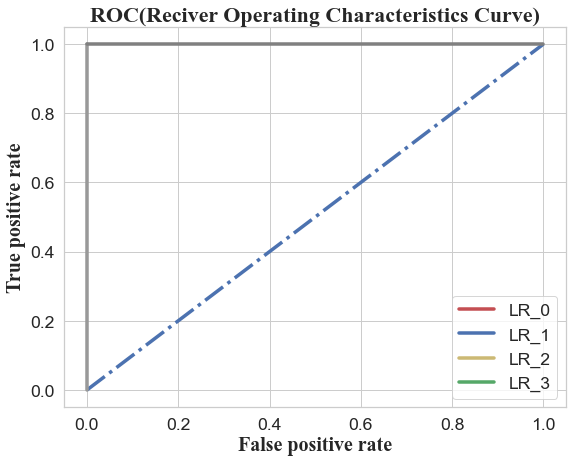

In [765]:
tmrfont = {'fontname':'Times New Roman' }
sns.set_context("notebook", font_scale=1.6, rc={"lines.linewidth": 3.5})
sns.set_style('whitegrid')
plt.figure(figsize=(9,7))
plt.title('ROC(Reciver Operating Characteristics Curve)', fontsize=22, fontweight='bold',**tmrfont)

plt.plot(FPR0_LR,TPR0_LR,label='LR_0',c='r')
plt.plot(FPR1_LR,TPR1_LR,label='LR_1',c='b')
plt.plot(FPR2_LR,TPR2_LR,label='LR_2',c='y')
plt.plot(FPR3_LR,TPR3_LR,label='LR_3',c='g')

plt.plot([0,1],ls='-.',mec='k--')
plt.plot([0,0],[1,0],c='.6')
plt.plot([1,1],c='.5')
plt.xlabel('False positive rate', fontsize=20, **tmrfont, fontweight='bold')
plt.ylabel('True positive rate', fontsize=20, **tmrfont, fontweight='bold')
plt.legend()
plt.show() 

## Evaluating the model

In [766]:
accuracy_LR = accuracy_score(Y_test,Y_pred_LR)
accuracy_LR

0.9438202247191011

In [767]:
specificity0_LR = TN0_LR / float(TN0_LR + FP0_LR)
specificity0_LR

1.0

In [768]:
specificity1_LR = TN1_LR / float(TN1_LR + FP1_LR)
specificity1_LR

0.9722222222222222

In [769]:
specificity2_LR = TN2_LR / float(TN2_LR + FP2_LR)
specificity2_LR

0.9577464788732394

In [770]:
specificity3_LR = TN3_LR / float(TN3_LR + FP3_LR)
specificity3_LR

1.0

In [771]:
print(classification_report(Y_test,Y_pred_LR))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        30
           1       0.88      0.88      0.88        17
           2       0.85      0.94      0.89        18
           3       1.00      0.96      0.98        24

    accuracy                           0.94        89
   macro avg       0.93      0.94      0.93        89
weighted avg       0.95      0.94      0.94        89



### ROC_AUC for LR

In [772]:
Y_pred_LR_proba = LR_classifier.predict_proba(X_test)

In [773]:
roc_auc_score(Y_test,Y_pred_LR_proba, multi_class="ovr")

0.995912714036775

## K-Nearest Neighbor Classifier

In [774]:
from sklearn.neighbors import KNeighborsClassifier
KNN_classifier = KNeighborsClassifier(n_neighbors = 7, metric = 'minkowski', p = 2)
KNN_classifier.fit(X_train, Y_train)
Y_pred_KNN = KNN_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [775]:
cm_KNN = confusion_matrix(Y_test, Y_pred_KNN)
cm_KNN

array([[26,  4,  0,  0],
       [ 4,  5,  8,  0],
       [ 0,  4, 12,  2],
       [ 0,  2,  4, 18]], dtype=int64)

In [776]:
TP0_KNN = cm_KNN[0, 0]
TP1_KNN = cm_KNN[1, 1]
TP2_KNN = cm_KNN[2, 2]
TP3_KNN = cm_KNN[3, 3]

FP0_KNN = cm_KNN[1, 0] + cm_KNN[2, 0] + cm_KNN[3, 0]
FP1_KNN = cm_KNN[0, 1] + cm_KNN[2, 1] + cm_KNN[3, 1]
FP2_KNN = cm_KNN[0, 2] + cm_KNN[1, 2] + cm_KNN[3, 2]
FP3_KNN = cm_KNN[0, 3] + cm_KNN[1, 3] + cm_KNN[2, 3]

TN0_KNN = cm_KNN[1, 1] + cm_KNN[1, 2] + cm_KNN[1, 3] + cm_KNN[2, 1] + cm_KNN[2, 2] + cm_KNN[2, 3] + cm_KNN[3, 1] + cm_KNN[3, 2] + cm_KNN[3, 3]
TN1_KNN = cm_KNN[0, 0] + cm_KNN[0, 2] + cm_KNN[0, 3] + cm_KNN[2, 0] + cm_KNN[2, 2] + cm_KNN[2, 3] + cm_KNN[3, 0] + cm_KNN[3, 2] + cm_KNN[3, 3]
TN2_KNN = cm_KNN[0, 0] + cm_KNN[0, 1] + cm_KNN[0, 3] + cm_KNN[1, 0] + cm_KNN[1, 1] + cm_KNN[1, 3] + cm_KNN[3, 0] + cm_KNN[3, 1] + cm_KNN[3, 3]
TN3_KNN = cm_KNN[0, 0] + cm_KNN[0, 1] + cm_KNN[0, 2] + cm_KNN[1, 0] + cm_KNN[1, 1] + cm_KNN[1, 2] + cm_KNN[2, 0] + cm_KNN[2, 1] + cm_KNN[2, 2]

FN0_KNN = cm_KNN[0, 1] + cm_KNN[0, 2] + cm_KNN[0, 3] 
FN1_KNN = cm_KNN[1, 0] + cm_KNN[1, 2] + cm_KNN[1, 3] 
FN2_KNN = cm_KNN[2, 0] + cm_KNN[2, 1] + cm_KNN[2, 3] 
FN3_KNN = cm_KNN[3, 0] + cm_KNN[3, 1] + cm_KNN[3, 2] 

In [777]:
accuracy_KNN = accuracy_score(Y_test,Y_pred_KNN)
accuracy_KNN

0.6853932584269663

In [778]:
specificity0_KNN = TN0_KNN / float(TN0_KNN + FP0_KNN)
specificity0_KNN

0.9322033898305084

In [779]:
specificity1_KNN = TN1_KNN / float(TN1_KNN + FP1_KNN)
specificity1_KNN

0.8611111111111112

In [780]:
specificity2_KNN = TN2_KNN / float(TN2_KNN + FP2_KNN)
specificity2_KNN

0.8309859154929577

In [781]:
specificity3_KNN = TN3_KNN / float(TN3_KNN + FP3_KNN)
specificity3_KNN

0.9692307692307692

In [782]:
print(classification_report(Y_test,Y_pred_KNN))

              precision    recall  f1-score   support

           0       0.87      0.87      0.87        30
           1       0.33      0.29      0.31        17
           2       0.50      0.67      0.57        18
           3       0.90      0.75      0.82        24

    accuracy                           0.69        89
   macro avg       0.65      0.64      0.64        89
weighted avg       0.70      0.69      0.69        89



## ROC_AUC for KNN

In [783]:
Y_pred_KNN_proba = KNN_classifier.predict_proba(X_test)

In [784]:
roc_auc_score(Y_test,Y_pred_KNN_proba, multi_class="ovr")

0.8838553753090074

## Hyper-parameter tuning of SVM

In [785]:
from sklearn.svm import SVC
model = SVC(kernel = 'linear', gamma='auto', C=30, probability=True, random_state = 0)
model.fit(X_train, Y_train)
model.score(X_test, Y_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.9775280898876404

### K-fold cross validation

In [786]:
from sklearn.model_selection import cross_val_score

In [787]:
cross_val_score(SVC(kernel = 'linear', C=30, gamma='auto', probability=True, random_state = 0),x,Y, cv=10)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users

array([0.93333333, 0.95555556, 0.91111111, 1.        , 0.88636364,
       1.        , 0.97727273, 0.95454545, 0.97727273, 0.97727273])

In [222]:
cross_val_score(SVC(kernel = 'rbf', C=10, gamma='auto', probability=True, random_state = 0),x,Y, cv=10)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users

array([0.93333333, 0.95555556, 0.93333333, 1.        , 0.86363636,
       0.97727273, 0.93181818, 0.93181818, 0.97727273, 0.93181818])

In [223]:
from sklearn.model_selection import GridSearchCV

In [228]:
clf = GridSearchCV(SVC(gamma='auto', 
                       probability=True, 
                       random_state = 0), {
    'C': [1,5,10,20],
    'kernel': ['rbf','linear','poly']
}, cv=10, return_train_score=False)

clf.fit(x,Y)
clf.cv_results_

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users

{'mean_fit_time': array([0.0316138 , 0.01774786, 0.01476233, 0.02452984, 0.02104216,
        0.01506219, 0.02423244, 0.02164114, 0.01376481, 0.0235364 ,
        0.02463198, 0.02503324]),
 'std_fit_time': array([0.00428688, 0.00147249, 0.00097757, 0.00185118, 0.00404152,
        0.00211088, 0.00118309, 0.00476484, 0.00075088, 0.00135116,
        0.00512857, 0.00507543]),
 'mean_score_time': array([0.00339479, 0.00199492, 0.0019953 , 0.00259504, 0.00219638,
        0.00219445, 0.00229414, 0.00199268, 0.00209534, 0.00259366,
        0.00389183, 0.00379016]),
 'std_score_time': array([6.63486383e-04, 4.39577398e-04, 8.49319130e-07, 4.91538411e-04,
        7.47134246e-04, 3.99927077e-04, 4.56965479e-04, 4.39909950e-04,
        2.99096507e-04, 4.89123664e-04, 5.03635403e-03, 1.32311873e-03]),
 'param_C': masked_array(data=[1, 1, 1, 5, 5, 5, 10, 10, 10, 20, 20, 20],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False],
   

In [229]:
SVM_hyperparameter = pd.DataFrame(clf.cv_results_)
SVM_hyperparameter

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.031614,0.004287,0.003395,6.634864e-04,1,rbf,"{'C': 1, 'kernel': 'rbf'}",0.888889,0.955556,1.000000,0.977778,0.863636,0.977273,0.931818,0.909091,0.954545,0.931818,0.939040,0.040489,11
1,0.017748,0.001472,0.001995,4.395774e-04,1,linear,"{'C': 1, 'kernel': 'linear'}",0.911111,0.977778,0.888889,1.000000,0.909091,0.977273,0.954545,0.931818,0.954545,0.954545,0.945960,0.033414,8
2,0.014762,0.000978,0.001995,8.493191e-07,1,poly,"{'C': 1, 'kernel': 'poly'}",1.000000,0.977778,0.933333,1.000000,0.886364,0.977273,0.931818,0.954545,0.977273,1.000000,0.963838,0.035388,2
3,0.024530,0.001851,0.002595,4.915384e-04,5,rbf,"{'C': 5, 'kernel': 'rbf'}",0.955556,0.955556,0.955556,1.000000,0.863636,0.977273,0.931818,0.909091,0.977273,0.931818,0.945758,0.037005,9
4,0.021042,0.004042,0.002196,7.471342e-04,5,linear,"{'C': 5, 'kernel': 'linear'}",0.933333,0.955556,0.911111,1.000000,0.886364,1.000000,0.977273,0.954545,0.977273,0.977273,0.957273,0.035488,5
5,0.015062,0.002111,0.002194,3.999271e-04,5,poly,"{'C': 5, 'kernel': 'poly'}",1.000000,1.000000,0.933333,1.000000,0.863636,1.000000,0.931818,0.954545,0.977273,0.954545,0.961515,0.041864,4
6,0.024232,0.001183,0.002294,4.569655e-04,10,rbf,"{'C': 10, 'kernel': 'rbf'}",0.933333,0.955556,0.933333,1.000000,0.863636,0.977273,0.931818,0.931818,0.977273,0.931818,0.943586,0.035515,10
7,0.021641,0.004765,0.001993,4.399100e-04,10,linear,"{'C': 10, 'kernel': 'linear'}",0.933333,0.955556,0.911111,1.000000,0.886364,1.000000,0.977273,0.954545,0.977273,0.977273,0.957273,0.035488,5
8,0.013765,0.000751,0.002095,2.990965e-04,10,poly,"{'C': 10, 'kernel': 'poly'}",1.000000,1.000000,0.933333,1.000000,0.886364,1.000000,0.931818,0.954545,0.977273,0.954545,0.963788,0.036799,3
9,0.023536,0.001351,0.002594,4.891237e-04,20,rbf,"{'C': 20, 'kernel': 'rbf'}",0.822222,0.955556,0.955556,1.000000,0.886364,0.954545,0.931818,0.931818,0.954545,0.931818,0.932424,0.045697,12


In [231]:
SVM_hyperparameter[['param_C','param_kernel','mean_test_score']]

,param_C,param_kernel,mean_test_score
0,1,rbf,0.939040
1,1,linear,0.945960
2,1,poly,0.963838
3,5,rbf,0.945758
4,5,linear,0.957273
5,5,poly,0.961515
6,10,rbf,0.943586
7,10,linear,0.957273
8,10,poly,0.963788
9,20,rbf,0.932424


## Support Vector Machine(SVM) Classifier

In [788]:
from sklearn.svm import SVC
SVM_classifier = SVC(kernel = 'linear', probability=True, random_state = 0)
SVM_classifier.fit(X_train, Y_train)
Y_pred_SVM = SVM_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [789]:
cm_SVM = confusion_matrix(Y_test, Y_pred_SVM)
cm_SVM

array([[30,  0,  0,  0],
       [ 0, 17,  0,  0],
       [ 0,  1, 16,  1],
       [ 0,  0,  1, 23]], dtype=int64)

In [790]:
TP0_SVM = cm_SVM[0, 0]
TP1_SVM = cm_SVM[1, 1]
TP2_SVM = cm_SVM[2, 2]
TP3_SVM = cm_SVM[3, 3]

FP0_SVM = cm_SVM[1, 0] + cm_SVM[2, 0] + cm_SVM[3, 0]
FP1_SVM = cm_SVM[0, 1] + cm_SVM[2, 1] + cm_SVM[3, 1]
FP2_SVM = cm_SVM[0, 2] + cm_SVM[1, 2] + cm_SVM[3, 2]
FP3_SVM = cm_SVM[0, 3] + cm_SVM[1, 3] + cm_SVM[2, 3]

TN0_SVM = cm_SVM[1, 1] + cm_SVM[1, 2] + cm_SVM[1, 3] + cm_SVM[2, 1] + cm_SVM[2, 2] + cm_SVM[2, 3] + cm_SVM[3, 1] + cm_SVM[3, 2] + cm_SVM[3, 3]
TN1_SVM = cm_SVM[0, 0] + cm_SVM[0, 2] + cm_SVM[0, 3] + cm_SVM[2, 0] + cm_SVM[2, 2] + cm_SVM[2, 3] + cm_SVM[3, 0] + cm_SVM[3, 2] + cm_SVM[3, 3]
TN2_SVM = cm_SVM[0, 0] + cm_SVM[0, 1] + cm_SVM[0, 3] + cm_SVM[1, 0] + cm_SVM[1, 1] + cm_SVM[1, 3] + cm_SVM[3, 0] + cm_SVM[3, 1] + cm_SVM[3, 3]
TN3_SVM = cm_SVM[0, 0] + cm_SVM[0, 1] + cm_SVM[0, 2] + cm_SVM[1, 0] + cm_SVM[1, 1] + cm_SVM[1, 2] + cm_SVM[2, 0] + cm_SVM[2, 1] + cm_SVM[2, 2]

FN0_SVM = cm_SVM[0, 1] + cm_SVM[0, 2] + cm_SVM[0, 3] 
FN1_SVM = cm_SVM[1, 0] + cm_SVM[1, 2] + cm_SVM[1, 3] 
FN2_SVM = cm_SVM[2, 0] + cm_SVM[2, 1] + cm_SVM[2, 3] 
FN3_SVM = cm_SVM[3, 0] + cm_SVM[3, 1] + cm_SVM[3, 2]

In [791]:
accuracy_SVM = accuracy_score(Y_test,Y_pred_SVM)
accuracy_SVM

0.9662921348314607

In [792]:
specificity0_SVM = TN0_SVM / float(TN0_SVM + FP0_SVM)
specificity0_SVM

1.0

In [793]:
specificity1_SVM = TN1_SVM / float(TN1_SVM + FP1_SVM)
specificity1_SVM

0.9861111111111112

In [794]:
specificity2_SVM = TN2_SVM / float(TN2_SVM + FP2_SVM)
specificity2_SVM

0.9859154929577465

In [795]:
specificity3_SVM = TN3_SVM / float(TN3_SVM + FP3_SVM)
specificity3_SVM

0.9846153846153847

In [796]:
print(classification_report(Y_test,Y_pred_SVM))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        30
           1       0.94      1.00      0.97        17
           2       0.94      0.89      0.91        18
           3       0.96      0.96      0.96        24

    accuracy                           0.97        89
   macro avg       0.96      0.96      0.96        89
weighted avg       0.97      0.97      0.97        89



### ROC_AUC for SVM

In [797]:
Y_pred_SVM_proba = SVM_classifier.predict_proba(X_test)

In [798]:
roc_auc_score(Y_test,Y_pred_SVM_proba, multi_class="ovr")

0.9992528891296497

## rbf Kernel SVM

In [957]:
from sklearn.svm import SVC
KernelSVM_classifier = SVC(kernel = 'rbf', probability=True, random_state = 0)
KernelSVM_classifier.fit(X_train, Y_train)
Y_pred_KernelSVM = KernelSVM_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [958]:
cm_KernelSVM = confusion_matrix(Y_test, Y_pred_KernelSVM)
cm_KernelSVM

array([[29,  1,  0,  0],
       [ 2, 14,  1,  0],
       [ 0,  2, 16,  0],
       [ 0,  0,  3, 21]], dtype=int64)

In [959]:
TP0_KernelSVM = cm_KernelSVM[0, 0]
TP1_KernelSVM = cm_KernelSVM[1, 1]
TP2_KernelSVM = cm_KernelSVM[2, 2]
TP3_KernelSVM = cm_KernelSVM[3, 3]

FP0_KernelSVM = cm_KernelSVM[1, 0] + cm_KernelSVM[2, 0] + cm_KernelSVM[3, 0]
FP1_KernelSVM = cm_KernelSVM[0, 1] + cm_KernelSVM[2, 1] + cm_KernelSVM[3, 1]
FP2_KernelSVM = cm_KernelSVM[0, 2] + cm_KernelSVM[1, 2] + cm_KernelSVM[3, 2]
FP3_KernelSVM = cm_KernelSVM[0, 3] + cm_KernelSVM[1, 3] + cm_KernelSVM[2, 3]

TN0_KernelSVM = cm_KernelSVM[1, 1] + cm_KernelSVM[1, 2] + cm_KernelSVM[1, 3] + cm_KernelSVM[2, 1] + cm_KernelSVM[2, 2] + cm_KernelSVM[2, 3] + cm_KernelSVM[3, 1] + cm_KernelSVM[3, 2] + cm_KernelSVM[3, 3]
TN1_KernelSVM = cm_KernelSVM[0, 0] + cm_KernelSVM[0, 2] + cm_KernelSVM[0, 3] + cm_KernelSVM[2, 0] + cm_KernelSVM[2, 2] + cm_KernelSVM[2, 3] + cm_KernelSVM[3, 0] + cm_KernelSVM[3, 2] + cm_KernelSVM[3, 3]
TN2_KernelSVM = cm_KernelSVM[0, 0] + cm_KernelSVM[0, 1] + cm_KernelSVM[0, 3] + cm_KernelSVM[1, 0] + cm_KernelSVM[1, 1] + cm_KernelSVM[1, 3] + cm_KernelSVM[3, 0] + cm_KernelSVM[3, 1] + cm_KernelSVM[3, 3]
TN3_KernelSVM = cm_KernelSVM[0, 0] + cm_KernelSVM[0, 1] + cm_KernelSVM[0, 2] + cm_KernelSVM[1, 0] + cm_KernelSVM[1, 1] + cm_KernelSVM[1, 2] + cm_KernelSVM[2, 0] + cm_KernelSVM[2, 1] + cm_KernelSVM[2, 2]

FN0_KernelSVM = cm_KernelSVM[0, 1] + cm_KernelSVM[0, 2] + cm_KernelSVM[0, 3] 
FN1_KernelSVM = cm_KernelSVM[1, 0] + cm_KernelSVM[1, 2] + cm_KernelSVM[1, 3] 
FN2_KernelSVM = cm_KernelSVM[2, 0] + cm_KernelSVM[2, 1] + cm_KernelSVM[2, 3] 
FN3_KernelSVM = cm_KernelSVM[3, 0] + cm_KernelSVM[3, 1] + cm_KernelSVM[3, 2]

In [960]:
specificity0_KernelSVM = TN0_KernelSVM / float(TN0_KernelSVM + FP0_KernelSVM)
specificity0_KernelSVM

0.9661016949152542

In [961]:
specificity1_KernelSVM = TN1_KernelSVM / float(TN1_KernelSVM + FP1_KernelSVM)
specificity1_KernelSVM

0.9583333333333334

In [962]:
specificity2_KernelSVM = TN2_KernelSVM / float(TN2_KernelSVM + FP2_KernelSVM)
specificity2_KernelSVM

0.9436619718309859

In [963]:
specificity3_KernelSVM = TN3_KernelSVM / float(TN3_KernelSVM + FP3_KernelSVM)
specificity3_KernelSVM

1.0

In [964]:
accuracy_KernelSVM = accuracy_score(Y_test,Y_pred_KernelSVM)
accuracy_KernelSVM

0.898876404494382

In [965]:
print(classification_report(Y_test,Y_pred_KernelSVM))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95        30
           1       0.82      0.82      0.82        17
           2       0.80      0.89      0.84        18
           3       1.00      0.88      0.93        24

    accuracy                           0.90        89
   macro avg       0.89      0.89      0.89        89
weighted avg       0.90      0.90      0.90        89



### ROC_AUC for KernelSVM

In [966]:
Y_pred_KernelSVM_proba = KernelSVM_classifier.predict_proba(X_test)

In [967]:
roc_auc_score(Y_test,Y_pred_KernelSVM_proba, multi_class="ovr")

0.981984845916686

## poly Kernel SVM

In [810]:
from sklearn.svm import SVC
PolySVM_classifier = SVC(kernel = 'poly', degree = 5, probability=True, random_state = 0)
PolySVM_classifier.fit(X_train, Y_train)
Y_pred_PolySVM = PolySVM_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [811]:
cm_PolySVM = confusion_matrix(Y_test, Y_pred_PolySVM)
cm_PolySVM

array([[12, 18,  0,  0],
       [ 0, 15,  2,  0],
       [ 0, 17,  1,  0],
       [ 0,  7,  3, 14]], dtype=int64)

In [812]:
TP0_PolySVM = cm_PolySVM[0, 0]
TP1_PolySVM = cm_PolySVM[1, 1]
TP2_PolySVM = cm_PolySVM[2, 2]
TP3_PolySVM = cm_PolySVM[3, 3]

FP0_PolySVM = cm_PolySVM[1, 0] + cm_PolySVM[2, 0] + cm_PolySVM[3, 0]
FP1_PolySVM = cm_PolySVM[0, 1] + cm_PolySVM[2, 1] + cm_PolySVM[3, 1]
FP2_PolySVM = cm_PolySVM[0, 2] + cm_PolySVM[1, 2] + cm_PolySVM[3, 2]
FP3_PolySVM = cm_PolySVM[0, 3] + cm_PolySVM[1, 3] + cm_PolySVM[2, 3]

TN0_PolySVM = cm_PolySVM[1, 1] + cm_PolySVM[1, 2] + cm_PolySVM[1, 3] + cm_PolySVM[2, 1] + cm_PolySVM[2, 2] + cm_PolySVM[2, 3] + cm_PolySVM[3, 1] + cm_PolySVM[3, 2] + cm_PolySVM[3, 3]
TN1_PolySVM = cm_PolySVM[0, 0] + cm_PolySVM[0, 2] + cm_PolySVM[0, 3] + cm_PolySVM[2, 0] + cm_PolySVM[2, 2] + cm_PolySVM[2, 3] + cm_PolySVM[3, 0] + cm_PolySVM[3, 2] + cm_PolySVM[3, 3]
TN2_PolySVM = cm_PolySVM[0, 0] + cm_PolySVM[0, 1] + cm_PolySVM[0, 3] + cm_PolySVM[1, 0] + cm_PolySVM[1, 1] + cm_PolySVM[1, 3] + cm_PolySVM[3, 0] + cm_PolySVM[3, 1] + cm_PolySVM[3, 3]
TN3_PolySVM = cm_PolySVM[0, 0] + cm_PolySVM[0, 1] + cm_PolySVM[0, 2] + cm_PolySVM[1, 0] + cm_PolySVM[1, 1] + cm_PolySVM[1, 2] + cm_PolySVM[2, 0] + cm_PolySVM[2, 1] + cm_PolySVM[2, 2]

FN0_PolySVM = cm_PolySVM[0, 1] + cm_PolySVM[0, 2] + cm_PolySVM[0, 3] 
FN1_PolySVM = cm_PolySVM[1, 0] + cm_PolySVM[1, 2] + cm_PolySVM[1, 3] 
FN2_PolySVM = cm_PolySVM[2, 0] + cm_PolySVM[2, 1] + cm_PolySVM[2, 3] 
FN3_PolySVM = cm_PolySVM[3, 0] + cm_PolySVM[3, 1] + cm_PolySVM[3, 2]

In [813]:
specificity0_PolySVM = TN0_PolySVM / float(TN0_PolySVM + FP0_PolySVM)
specificity0_PolySVM

1.0

In [814]:
specificity1_PolySVM = TN1_PolySVM / float(TN1_PolySVM + FP1_PolySVM)
specificity1_PolySVM

0.4166666666666667

In [815]:
specificity2_PolySVM = TN2_PolySVM / float(TN2_PolySVM + FP2_PolySVM)
specificity2_PolySVM

0.9295774647887324

In [816]:
specificity3_PolySVM = TN3_PolySVM / float(TN3_PolySVM + FP3_PolySVM)
specificity3_PolySVM

1.0

In [817]:
accuracy_PolySVM = accuracy_score(Y_test,Y_pred_PolySVM)
accuracy_PolySVM

0.47191011235955055

In [818]:
print(classification_report(Y_test,Y_pred_PolySVM))

              precision    recall  f1-score   support

           0       1.00      0.40      0.57        30
           1       0.26      0.88      0.41        17
           2       0.17      0.06      0.08        18
           3       1.00      0.58      0.74        24

    accuracy                           0.47        89
   macro avg       0.61      0.48      0.45        89
weighted avg       0.69      0.47      0.49        89



### ROC_AUC for PolySVM

In [819]:
Y_pred_PolySVM_proba = PolySVM_classifier.predict_proba(X_test)

In [820]:
roc_auc_score(Y_test,Y_pred_PolySVM_proba, multi_class="ovr")

0.9126285792916183

## Adaboost Classifier

In [821]:
from sklearn.ensemble import AdaBoostClassifier
Ada_classifier = AdaBoostClassifier()
Ada_classifier.fit(X_train,Y_train)
Y_pred_Ada = Ada_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [822]:
cm_Ada = confusion_matrix(Y_test, Y_pred_Ada)
cm_Ada

array([[25,  5,  0,  0],
       [ 0, 14,  3,  0],
       [ 0,  3, 14,  1],
       [ 0,  0,  1, 23]], dtype=int64)

In [823]:
TP0_Ada = cm_Ada[0, 0]
TP1_Ada = cm_Ada[1, 1]
TP2_Ada = cm_Ada[2, 2]
TP3_Ada = cm_Ada[3, 3]

FP0_Ada = cm_Ada[1, 0] + cm_Ada[2, 0] + cm_Ada[3, 0]
FP1_Ada = cm_Ada[0, 1] + cm_Ada[2, 1] + cm_Ada[3, 1]
FP2_Ada = cm_Ada[0, 2] + cm_Ada[1, 2] + cm_Ada[3, 2]
FP3_Ada = cm_Ada[0, 3] + cm_Ada[1, 3] + cm_Ada[2, 3]

TN0_Ada = cm_Ada[1, 1] + cm_Ada[1, 2] + cm_Ada[1, 3] + cm_Ada[2, 1] + cm_Ada[2, 2] + cm_Ada[2, 3] + cm_Ada[3, 1] + cm_Ada[3, 2] + cm_Ada[3, 3]
TN1_Ada = cm_Ada[0, 0] + cm_Ada[0, 2] + cm_Ada[0, 3] + cm_Ada[2, 0] + cm_Ada[2, 2] + cm_Ada[2, 3] + cm_Ada[3, 0] + cm_Ada[3, 2] + cm_Ada[3, 3]
TN2_Ada = cm_Ada[0, 0] + cm_Ada[0, 1] + cm_Ada[0, 3] + cm_Ada[1, 0] + cm_Ada[1, 1] + cm_Ada[1, 3] + cm_Ada[3, 0] + cm_Ada[3, 1] + cm_Ada[3, 3]
TN3_Ada = cm_Ada[0, 0] + cm_Ada[0, 1] + cm_Ada[0, 2] + cm_Ada[1, 0] + cm_Ada[1, 1] + cm_Ada[1, 2] + cm_Ada[2, 0] + cm_Ada[2, 1] + cm_Ada[2, 2]

FN0_Ada = cm_Ada[0, 1] + cm_Ada[0, 2] + cm_Ada[0, 3] 
FN1_Ada = cm_Ada[1, 0] + cm_Ada[1, 2] + cm_Ada[1, 3] 
FN2_Ada = cm_Ada[2, 0] + cm_Ada[2, 1] + cm_Ada[2, 3] 
FN3_Ada = cm_Ada[3, 0] + cm_Ada[3, 1] + cm_Ada[3, 2]

In [824]:
specificity0_Ada = TN0_Ada / float(TN0_Ada + FP0_Ada)
specificity0_Ada

1.0

In [825]:
specificity1_Ada = TN1_Ada / float(TN1_Ada + FP1_Ada)
specificity1_Ada

0.8888888888888888

In [826]:
specificity2_Ada = TN2_Ada / float(TN2_Ada + FP2_Ada)
specificity2_Ada

0.9436619718309859

In [827]:
specificity3_Ada = TN3_Ada / float(TN3_Ada + FP3_Ada)
specificity3_Ada

0.9846153846153847

In [828]:
accuracy_Ada = accuracy_score(Y_test,Y_pred_Ada)
accuracy_Ada

0.8539325842696629

In [829]:
print(classification_report(Y_test,Y_pred_Ada))

              precision    recall  f1-score   support

           0       1.00      0.83      0.91        30
           1       0.64      0.82      0.72        17
           2       0.78      0.78      0.78        18
           3       0.96      0.96      0.96        24

    accuracy                           0.85        89
   macro avg       0.84      0.85      0.84        89
weighted avg       0.87      0.85      0.86        89



### ROC_AUC for Ada

In [830]:
Y_pred_Ada_proba = Ada_classifier.predict_proba(X_test)

In [831]:
roc_auc_score(Y_test,Y_pred_Ada_proba, multi_class="ovr")

0.9647718800382289

## Naive Bayes Classifier

In [832]:
from sklearn.naive_bayes import GaussianNB
NB_classifier = GaussianNB()
NB_classifier.fit(X_train, Y_train)
Y_pred_NB = NB_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [833]:
cm_NB = confusion_matrix(Y_test, Y_pred_NB)
cm_NB

array([[17,  0, 13,  0],
       [ 0,  0, 17,  0],
       [ 0,  0, 15,  3],
       [ 0,  0,  2, 22]], dtype=int64)

In [834]:
TP0_NB = cm_NB[0, 0]
TP1_NB = cm_NB[1, 1]
TP2_NB = cm_NB[2, 2]
TP3_NB = cm_NB[3, 3]

FP0_NB = cm_NB[1, 0] + cm_NB[2, 0] + cm_NB[3, 0]
FP1_NB = cm_NB[0, 1] + cm_NB[2, 1] + cm_NB[3, 1]
FP2_NB = cm_NB[0, 2] + cm_NB[1, 2] + cm_NB[3, 2]
FP3_NB = cm_NB[0, 3] + cm_NB[1, 3] + cm_NB[2, 3]

TN0_NB = cm_NB[1, 1] + cm_NB[1, 2] + cm_NB[1, 3] + cm_NB[2, 1] + cm_NB[2, 2] + cm_NB[2, 3] + cm_NB[3, 1] + cm_NB[3, 2] + cm_NB[3, 3]
TN1_NB = cm_NB[0, 0] + cm_NB[0, 2] + cm_NB[0, 3] + cm_NB[2, 0] + cm_NB[2, 2] + cm_NB[2, 3] + cm_NB[3, 0] + cm_NB[3, 2] + cm_NB[3, 3]
TN2_NB = cm_NB[0, 0] + cm_NB[0, 1] + cm_NB[0, 3] + cm_NB[1, 0] + cm_NB[1, 1] + cm_NB[1, 3] + cm_NB[3, 0] + cm_NB[3, 1] + cm_NB[3, 3]
TN3_NB = cm_NB[0, 0] + cm_NB[0, 1] + cm_NB[0, 2] + cm_NB[1, 0] + cm_NB[1, 1] + cm_NB[1, 2] + cm_NB[2, 0] + cm_NB[2, 1] + cm_NB[2, 2]

FN0_NB = cm_NB[0, 1] + cm_NB[0, 2] + cm_NB[0, 3] 
FN1_NB = cm_NB[1, 0] + cm_NB[1, 2] + cm_NB[1, 3] 
FN2_NB = cm_NB[2, 0] + cm_NB[2, 1] + cm_NB[2, 3] 
FN3_NB = cm_NB[3, 0] + cm_NB[3, 1] + cm_NB[3, 2]

In [835]:
specificity0_NB = TN0_NB / float(TN0_NB + FP0_NB)
specificity0_NB

1.0

In [836]:
specificity1_NB = TN1_NB / float(TN1_NB + FP1_NB)
specificity1_NB

1.0

In [837]:
specificity2_NB = TN2_NB / float(TN2_NB + FP2_NB)
specificity2_NB

0.5492957746478874

In [838]:
specificity3_NB = TN3_NB / float(TN3_NB + FP3_NB)
specificity3_NB

0.9538461538461539

In [839]:
accuracy_NB = accuracy_score(Y_test,Y_pred_NB)
accuracy_NB

0.6067415730337079

In [840]:
print(classification_report(Y_test,Y_pred_NB))

              precision    recall  f1-score   support

           0       1.00      0.57      0.72        30
           1       0.00      0.00      0.00        17
           2       0.32      0.83      0.46        18
           3       0.88      0.92      0.90        24

    accuracy                           0.61        89
   macro avg       0.55      0.58      0.52        89
weighted avg       0.64      0.61      0.58        89



C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### ROC_AUC for NB

In [841]:
Y_pred_NB_proba = NB_classifier.predict_proba(X_test)

In [842]:
roc_auc_score(Y_test,Y_pred_NB_proba, multi_class="ovr")

0.8182604130247995

## Decision Tree Classifier

In [843]:
from sklearn.tree import DecisionTreeClassifier
DT_classifier = DecisionTreeClassifier(criterion = "entropy", random_state = 0)
DT_classifier.fit(X_train, Y_train)
Y_pred_DT = DT_classifier.predict(X_test)

In [844]:
cm_DT = confusion_matrix(Y_test, Y_pred_DT)
cm_DT

array([[26,  4,  0,  0],
       [ 1, 12,  4,  0],
       [ 0,  4, 12,  2],
       [ 0,  0,  0, 24]], dtype=int64)

In [845]:
TP0_DT = cm_DT[0, 0]
TP1_DT = cm_DT[1, 1]
TP2_DT = cm_DT[2, 2]
TP3_DT = cm_DT[3, 3]

FP0_DT = cm_DT[1, 0] + cm_DT[2, 0] + cm_DT[3, 0]
FP1_DT = cm_DT[0, 1] + cm_DT[2, 1] + cm_DT[3, 1]
FP2_DT = cm_DT[0, 2] + cm_DT[1, 2] + cm_DT[3, 2]
FP3_DT = cm_DT[0, 3] + cm_DT[1, 3] + cm_DT[2, 3]

TN0_DT = cm_DT[1, 1] + cm_DT[1, 2] + cm_DT[1, 3] + cm_DT[2, 1] + cm_DT[2, 2] + cm_DT[2, 3] + cm_DT[3, 1] + cm_DT[3, 2] + cm_DT[3, 3]
TN1_DT = cm_DT[0, 0] + cm_DT[0, 2] + cm_DT[0, 3] + cm_DT[2, 0] + cm_DT[2, 2] + cm_DT[2, 3] + cm_DT[3, 0] + cm_DT[3, 2] + cm_DT[3, 3]
TN2_DT = cm_DT[0, 0] + cm_DT[0, 1] + cm_DT[0, 3] + cm_DT[1, 0] + cm_DT[1, 1] + cm_DT[1, 3] + cm_DT[3, 0] + cm_DT[3, 1] + cm_DT[3, 3]
TN3_DT = cm_DT[0, 0] + cm_DT[0, 1] + cm_DT[0, 2] + cm_DT[1, 0] + cm_DT[1, 1] + cm_DT[1, 2] + cm_DT[2, 0] + cm_DT[2, 1] + cm_DT[2, 2]

FN0_DT = cm_DT[0, 1] + cm_DT[0, 2] + cm_DT[0, 3] 
FN1_DT = cm_DT[1, 0] + cm_DT[1, 2] + cm_DT[1, 3] 
FN2_DT = cm_DT[2, 0] + cm_DT[2, 1] + cm_DT[2, 3] 
FN3_DT = cm_DT[3, 0] + cm_DT[3, 1] + cm_DT[3, 2]

In [846]:
specificity0_DT = TN0_DT / float(TN0_DT + FP0_DT)
specificity0_DT

0.9830508474576272

In [847]:
specificity1_DT = TN1_DT / float(TN1_DT + FP1_DT)
specificity1_DT

0.8888888888888888

In [848]:
specificity2_DT = TN2_DT / float(TN2_DT + FP2_DT)
specificity2_DT

0.9436619718309859

In [849]:
specificity3_DT = TN3_DT / float(TN3_DT + FP3_DT)
specificity3_DT

0.9692307692307692

In [850]:
accuracy_DT = accuracy_score(Y_test,Y_pred_DT)
accuracy_DT

0.8314606741573034

In [851]:
print(classification_report(Y_test,Y_pred_DT))

              precision    recall  f1-score   support

           0       0.96      0.87      0.91        30
           1       0.60      0.71      0.65        17
           2       0.75      0.67      0.71        18
           3       0.92      1.00      0.96        24

    accuracy                           0.83        89
   macro avg       0.81      0.81      0.81        89
weighted avg       0.84      0.83      0.83        89



### ROC_AUC for DT

In [852]:
Y_pred_DT_proba = DT_classifier.predict_proba(X_test)

In [853]:
roc_auc_score(Y_test,Y_pred_DT_proba, multi_class="ovr")

0.8780060204603477

## Random Forest Classifier

In [854]:
from sklearn.ensemble import RandomForestClassifier
RF_classifier = RandomForestClassifier(n_estimators = 7, criterion = "entropy", random_state = 0)
RF_classifier.fit(X_train, Y_train)
Y_pred_RF = RF_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\ipykernel_launcher.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [855]:
cm_RF = confusion_matrix(Y_test, Y_pred_RF)
cm_RF

array([[27,  3,  0,  0],
       [ 2, 12,  3,  0],
       [ 0,  4, 11,  3],
       [ 0,  0,  1, 23]], dtype=int64)

In [856]:
TP0_RF = cm_RF[0, 0]
TP1_RF = cm_RF[1, 1]
TP2_RF = cm_RF[2, 2]
TP3_RF = cm_RF[3, 3]

FP0_RF = cm_RF[1, 0] + cm_RF[2, 0] + cm_RF[3, 0]
FP1_RF = cm_RF[0, 1] + cm_RF[2, 1] + cm_RF[3, 1]
FP2_RF = cm_RF[0, 2] + cm_RF[1, 2] + cm_RF[3, 2]
FP3_RF = cm_RF[0, 3] + cm_RF[1, 3] + cm_RF[2, 3]

TN0_RF = cm_RF[1, 1] + cm_RF[1, 2] + cm_RF[1, 3] + cm_RF[2, 1] + cm_RF[2, 2] + cm_RF[2, 3] + cm_RF[3, 1] + cm_RF[3, 2] + cm_RF[3, 3]
TN1_RF = cm_RF[0, 0] + cm_RF[0, 2] + cm_RF[0, 3] + cm_RF[2, 0] + cm_RF[2, 2] + cm_RF[2, 3] + cm_RF[3, 0] + cm_RF[3, 2] + cm_RF[3, 3]
TN2_RF = cm_RF[0, 0] + cm_RF[0, 1] + cm_RF[0, 3] + cm_RF[1, 0] + cm_RF[1, 1] + cm_RF[1, 3] + cm_RF[3, 0] + cm_RF[3, 1] + cm_RF[3, 3]
TN3_RF = cm_RF[0, 0] + cm_RF[0, 1] + cm_RF[0, 2] + cm_RF[1, 0] + cm_RF[1, 1] + cm_RF[1, 2] + cm_RF[2, 0] + cm_RF[2, 1] + cm_RF[2, 2]

FN0_RF = cm_RF[0, 1] + cm_RF[0, 2] + cm_RF[0, 3] 
FN1_RF = cm_RF[1, 0] + cm_RF[1, 2] + cm_RF[1, 3] 
FN2_RF = cm_RF[2, 0] + cm_RF[2, 1] + cm_RF[2, 3] 
FN3_RF = cm_RF[3, 0] + cm_RF[3, 1] + cm_RF[3, 2]

In [857]:
specificity0_RF = TN0_RF / float(TN0_RF + FP0_RF)
specificity0_RF

0.9661016949152542

In [858]:
specificity1_RF = TN1_RF / float(TN1_RF + FP1_RF)
specificity1_RF

0.9027777777777778

In [859]:
specificity2_RF = TN2_RF / float(TN2_RF + FP2_RF)
specificity2_RF

0.9436619718309859

In [860]:
specificity3_RF = TN3_RF / float(TN3_RF + FP3_RF)
specificity3_RF

0.9538461538461539

In [861]:
accuracy_RF = accuracy_score(Y_test,Y_pred_RF)
accuracy_RF

0.8202247191011236

In [862]:
print(classification_report(Y_test,Y_pred_RF))

              precision    recall  f1-score   support

           0       0.93      0.90      0.92        30
           1       0.63      0.71      0.67        17
           2       0.73      0.61      0.67        18
           3       0.88      0.96      0.92        24

    accuracy                           0.82        89
   macro avg       0.80      0.79      0.79        89
weighted avg       0.82      0.82      0.82        89



### ROC_AUC for RF

In [863]:
Y_pred_RF_proba = RF_classifier.predict_proba(X_test)

In [864]:
roc_auc_score(Y_test,Y_pred_RF_proba, multi_class="ovr")

0.9297892193018873

## Gradient Boosting

In [865]:
from sklearn.ensemble import GradientBoostingClassifier
GB_classifier = GradientBoostingClassifier(n_estimators=100, learning_rate=0.3)
GB_classifier.fit(X_train, Y_train)
Y_pred_GB = GB_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [866]:
cm_GB = confusion_matrix(Y_test, Y_pred_GB)
cm_GB

array([[28,  2,  0,  0],
       [ 1, 13,  3,  0],
       [ 0,  1, 13,  4],
       [ 0,  0,  1, 23]], dtype=int64)

In [867]:
TP0_GB = cm_GB[0, 0]
TP1_GB = cm_GB[1, 1]
TP2_GB = cm_GB[2, 2]
TP3_GB = cm_GB[3, 3]

FP0_GB = cm_GB[1, 0] + cm_GB[2, 0] + cm_GB[3, 0]
FP1_GB = cm_GB[0, 1] + cm_GB[2, 1] + cm_GB[3, 1]
FP2_GB = cm_GB[0, 2] + cm_GB[1, 2] + cm_GB[3, 2]
FP3_GB = cm_GB[0, 3] + cm_GB[1, 3] + cm_GB[2, 3]

TN0_GB = cm_GB[1, 1] + cm_GB[1, 2] + cm_GB[1, 3] + cm_GB[2, 1] + cm_GB[2, 2] + cm_GB[2, 3] + cm_GB[3, 1] + cm_GB[3, 2] + cm_GB[3, 3]
TN1_GB = cm_GB[0, 0] + cm_GB[0, 2] + cm_GB[0, 3] + cm_GB[2, 0] + cm_GB[2, 2] + cm_GB[2, 3] + cm_GB[3, 0] + cm_GB[3, 2] + cm_GB[3, 3]
TN2_GB = cm_GB[0, 0] + cm_GB[0, 1] + cm_GB[0, 3] + cm_GB[1, 0] + cm_GB[1, 1] + cm_GB[1, 3] + cm_GB[3, 0] + cm_GB[3, 1] + cm_GB[3, 3]
TN3_GB = cm_GB[0, 0] + cm_GB[0, 1] + cm_GB[0, 2] + cm_GB[1, 0] + cm_GB[1, 1] + cm_GB[1, 2] + cm_GB[2, 0] + cm_GB[2, 1] + cm_GB[2, 2]

FN0_GB = cm_GB[0, 1] + cm_GB[0, 2] + cm_GB[0, 3] 
FN1_GB = cm_GB[1, 0] + cm_GB[1, 2] + cm_GB[1, 3] 
FN2_GB = cm_GB[2, 0] + cm_GB[2, 1] + cm_GB[2, 3] 
FN3_GB = cm_GB[3, 0] + cm_GB[3, 1] + cm_GB[3, 2]

In [868]:
specificity0_GB = TN0_GB / float(TN0_GB + FP0_GB)
specificity0_GB

0.9830508474576272

In [869]:
specificity1_GB = TN1_GB / float(TN1_GB + FP1_GB)
specificity1_GB

0.9583333333333334

In [870]:
specificity2_GB = TN2_GB / float(TN2_GB + FP2_GB)
specificity2_GB

0.9436619718309859

In [871]:
specificity3_GB = TN3_GB / float(TN3_GB + FP3_GB)
specificity3_GB

0.9384615384615385

In [872]:
accuracy_GB = accuracy_score(Y_test,Y_pred_GB)
accuracy_GB

0.8651685393258427

In [873]:
print(classification_report(Y_test,Y_pred_GB))

              precision    recall  f1-score   support

           0       0.97      0.93      0.95        30
           1       0.81      0.76      0.79        17
           2       0.76      0.72      0.74        18
           3       0.85      0.96      0.90        24

    accuracy                           0.87        89
   macro avg       0.85      0.84      0.85        89
weighted avg       0.87      0.87      0.86        89



### ROC_AUC for GB

In [874]:
Y_pred_GB_proba = GB_classifier.predict_proba(X_test)

In [875]:
roc_auc_score(Y_test,Y_pred_GB_proba, multi_class="ovr")

0.9730316844098738

## Stochastic Gradient Descent

In [876]:
from sklearn.linear_model import SGDClassifier
SGD_classifier = SGDClassifier(loss="modified_huber", penalty="l2", alpha=0.001)
SGD_classifier.fit(X_train, Y_train)
Y_pred_SGD = SGD_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [877]:
cm_SGD = confusion_matrix(Y_test, Y_pred_SGD)
cm_SGD 

array([[25,  2,  3,  0],
       [ 0, 12,  5,  0],
       [ 0,  9,  9,  0],
       [ 0,  1,  0, 23]], dtype=int64)

In [878]:
TP0_SGD = cm_SGD[0, 0]
TP1_SGD = cm_SGD[1, 1]
TP2_SGD = cm_SGD[2, 2]
TP3_SGD = cm_SGD[3, 3]

FP0_SGD = cm_SGD[1, 0] + cm_SGD[2, 0] + cm_SGD[3, 0]
FP1_SGD = cm_SGD[0, 1] + cm_SGD[2, 1] + cm_SGD[3, 1]
FP2_SGD = cm_SGD[0, 2] + cm_SGD[1, 2] + cm_SGD[3, 2]
FP3_SGD = cm_SGD[0, 3] + cm_SGD[1, 3] + cm_SGD[2, 3]

TN0_SGD = cm_SGD[1, 1] + cm_SGD[1, 2] + cm_SGD[1, 3] + cm_SGD[2, 1] + cm_SGD[2, 2] + cm_SGD[2, 3] + cm_SGD[3, 1] + cm_SGD[3, 2] + cm_SGD[3, 3]
TN1_SGD = cm_SGD[0, 0] + cm_SGD[0, 2] + cm_SGD[0, 3] + cm_SGD[2, 0] + cm_SGD[2, 2] + cm_SGD[2, 3] + cm_SGD[3, 0] + cm_SGD[3, 2] + cm_SGD[3, 3]
TN2_SGD = cm_SGD[0, 0] + cm_SGD[0, 1] + cm_SGD[0, 3] + cm_SGD[1, 0] + cm_SGD[1, 1] + cm_SGD[1, 3] + cm_SGD[3, 0] + cm_SGD[3, 1] + cm_SGD[3, 3]
TN3_SGD = cm_SGD[0, 0] + cm_SGD[0, 1] + cm_SGD[0, 2] + cm_SGD[1, 0] + cm_SGD[1, 1] + cm_SGD[1, 2] + cm_SGD[2, 0] + cm_SGD[2, 1] + cm_SGD[2, 2]

FN0_SGD = cm_SGD[0, 1] + cm_SGD[0, 2] + cm_SGD[0, 3] 
FN1_SGD = cm_SGD[1, 0] + cm_SGD[1, 2] + cm_SGD[1, 3] 
FN2_SGD = cm_SGD[2, 0] + cm_SGD[2, 1] + cm_SGD[2, 3] 
FN3_SGD = cm_SGD[3, 0] + cm_SGD[3, 1] + cm_SGD[3, 2]

In [879]:
specificity0_SGD = TN0_SGD / float(TN0_SGD + FP0_SGD)
specificity0_SGD

1.0

In [880]:
specificity1_SGD = TN1_SGD / float(TN1_SGD + FP1_SGD)
specificity1_SGD

0.8333333333333334

In [881]:
specificity2_SGD = TN2_SGD / float(TN2_SGD + FP2_SGD)
specificity2_SGD

0.8873239436619719

In [882]:
specificity3_SGD = TN3_SGD / float(TN3_SGD + FP3_SGD)
specificity3_SGD

1.0

In [883]:
accuracy_SGD = accuracy_score(Y_test,Y_pred_SGD)
accuracy_SGD

0.7752808988764045

In [884]:
print(classification_report(Y_test,Y_pred_SGD))

              precision    recall  f1-score   support

           0       1.00      0.83      0.91        30
           1       0.50      0.71      0.59        17
           2       0.53      0.50      0.51        18
           3       1.00      0.96      0.98        24

    accuracy                           0.78        89
   macro avg       0.76      0.75      0.75        89
weighted avg       0.81      0.78      0.79        89



### ROC_AUC for SGD

In [885]:
Y_pred_SGD_proba = SGD_classifier.predict_proba(X_test)

In [886]:
roc_auc_score(Y_test,Y_pred_SGD_proba, multi_class="ovr")

0.8272175378283111

## Quadratic Discriminant Analysis

In [887]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
QDA_classifier = QuadraticDiscriminantAnalysis()
QDA_classifier.fit(X_train, Y_train)
Y_pred_QDA = QDA_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\discriminant_analysis.py:808: UserWarning:

Variables are collinear



In [888]:
cm_QDA = confusion_matrix(Y_test, Y_pred_QDA)
cm_QDA

array([[10,  0, 11,  9],
       [ 0,  0, 15,  2],
       [ 0,  0, 15,  3],
       [ 0,  0, 14, 10]], dtype=int64)

In [889]:
TP0_QDA = cm_QDA[0, 0]
TP1_QDA = cm_QDA[1, 1]
TP2_QDA = cm_QDA[2, 2]
TP3_QDA = cm_QDA[3, 3]

FP0_QDA = cm_QDA[1, 0] + cm_QDA[2, 0] + cm_QDA[3, 0]
FP1_QDA = cm_QDA[0, 1] + cm_QDA[2, 1] + cm_QDA[3, 1]
FP2_QDA = cm_QDA[0, 2] + cm_QDA[1, 2] + cm_QDA[3, 2]
FP3_QDA = cm_QDA[0, 3] + cm_QDA[1, 3] + cm_QDA[2, 3]

TN0_QDA = cm_QDA[1, 1] + cm_QDA[1, 2] + cm_QDA[1, 3] + cm_QDA[2, 1] + cm_QDA[2, 2] + cm_QDA[2, 3] + cm_QDA[3, 1] + cm_QDA[3, 2] + cm_QDA[3, 3]
TN1_QDA = cm_QDA[0, 0] + cm_QDA[0, 2] + cm_QDA[0, 3] + cm_QDA[2, 0] + cm_QDA[2, 2] + cm_QDA[2, 3] + cm_QDA[3, 0] + cm_QDA[3, 2] + cm_QDA[3, 3]
TN2_QDA = cm_QDA[0, 0] + cm_QDA[0, 1] + cm_QDA[0, 3] + cm_QDA[1, 0] + cm_QDA[1, 1] + cm_QDA[1, 3] + cm_QDA[3, 0] + cm_QDA[3, 1] + cm_QDA[3, 3]
TN3_QDA = cm_QDA[0, 0] + cm_QDA[0, 1] + cm_QDA[0, 2] + cm_QDA[1, 0] + cm_QDA[1, 1] + cm_QDA[1, 2] + cm_QDA[2, 0] + cm_QDA[2, 1] + cm_QDA[2, 2]

FN0_QDA = cm_QDA[0, 1] + cm_QDA[0, 2] + cm_QDA[0, 3] 
FN1_QDA = cm_QDA[1, 0] + cm_QDA[1, 2] + cm_QDA[1, 3] 
FN2_QDA = cm_QDA[2, 0] + cm_QDA[2, 1] + cm_QDA[2, 3] 
FN3_QDA = cm_QDA[3, 0] + cm_QDA[3, 1] + cm_QDA[3, 2]

In [890]:
specificity0_QDA = TN0_QDA / float(TN0_QDA + FP0_QDA)
specificity0_QDA

1.0

In [891]:
specificity1_QDA = TN1_QDA / float(TN1_QDA + FP1_QDA)
specificity1_QDA

1.0

In [892]:
specificity2_QDA = TN2_QDA / float(TN2_QDA + FP2_QDA)
specificity2_QDA

0.43661971830985913

In [893]:
specificity3_QDA = TN3_QDA / float(TN3_QDA + FP3_QDA)
specificity3_QDA

0.7846153846153846

In [894]:
accuracy_QDA = accuracy_score(Y_test,Y_pred_QDA)
accuracy_QDA

0.39325842696629215

In [895]:
print(classification_report(Y_test,Y_pred_QDA))

              precision    recall  f1-score   support

           0       1.00      0.33      0.50        30
           1       0.00      0.00      0.00        17
           2       0.27      0.83      0.41        18
           3       0.42      0.42      0.42        24

    accuracy                           0.39        89
   macro avg       0.42      0.40      0.33        89
weighted avg       0.50      0.39      0.36        89



C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### ROC_AUC for QDA

In [896]:
Y_pred_QDA_proba = QDA_classifier.predict_proba(X_test)

In [897]:
roc_auc_score(Y_test,Y_pred_QDA_proba, multi_class="ovr")

0.7630405986206542

## Gaussian Process Classifier

In [907]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
GP_classifier = GaussianProcessClassifier(1.0 * RBF(1.0))
GP_classifier.fit(X_train, Y_train)
Y_pred_GP = GP_classifier.predict(X_test)

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\gaussian_process\kernels.py:418: ConvergenceWarning:

The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.



In [908]:
cm_GP = confusion_matrix(Y_test, Y_pred_GP)
cm_GP

array([[30,  0,  0,  0],
       [17,  0,  0,  0],
       [18,  0,  0,  0],
       [24,  0,  0,  0]], dtype=int64)

In [909]:
TP0_GP = cm_GP[0, 0]
TP1_GP = cm_GP[1, 1]
TP2_GP = cm_GP[2, 2]
TP3_GP = cm_GP[3, 3]

FP0_GP = cm_GP[1, 0] + cm_GP[2, 0] + cm_GP[3, 0]
FP1_GP = cm_GP[0, 1] + cm_GP[2, 1] + cm_GP[3, 1]
FP2_GP = cm_GP[0, 2] + cm_GP[1, 2] + cm_GP[3, 2]
FP3_GP = cm_GP[0, 3] + cm_GP[1, 3] + cm_GP[2, 3]

TN0_GP = cm_GP[1, 1] + cm_GP[1, 2] + cm_GP[1, 3] + cm_GP[2, 1] + cm_GP[2, 2] + cm_GP[2, 3] + cm_GP[3, 1] + cm_GP[3, 2] + cm_GP[3, 3]
TN1_GP = cm_GP[0, 0] + cm_GP[0, 2] + cm_GP[0, 3] + cm_GP[2, 0] + cm_GP[2, 2] + cm_GP[2, 3] + cm_GP[3, 0] + cm_GP[3, 2] + cm_GP[3, 3]
TN2_GP = cm_GP[0, 0] + cm_GP[0, 1] + cm_GP[0, 3] + cm_GP[1, 0] + cm_GP[1, 1] + cm_GP[1, 3] + cm_GP[3, 0] + cm_GP[3, 1] + cm_GP[3, 3]
TN3_GP = cm_GP[0, 0] + cm_GP[0, 1] + cm_GP[0, 2] + cm_GP[1, 0] + cm_GP[1, 1] + cm_GP[1, 2] + cm_GP[2, 0] + cm_GP[2, 1] + cm_GP[2, 2]

FN0_GP = cm_GP[0, 1] + cm_GP[0, 2] + cm_GP[0, 3] 
FN1_GP = cm_GP[1, 0] + cm_GP[1, 2] + cm_GP[1, 3] 
FN2_GP = cm_GP[2, 0] + cm_GP[2, 1] + cm_GP[2, 3] 
FN3_GP = cm_GP[3, 0] + cm_GP[3, 1] + cm_GP[3, 2]

In [910]:
specificity0_GP = TN0_GP / float(TN0_GP + FP0_GP)
specificity0_GP

0.0

In [911]:
specificity1_GP = TN1_GP / float(TN1_GP + FP1_GP)
specificity1_GP

1.0

In [912]:
specificity2_GP = TN2_GP / float(TN2_GP + FP2_GP)
specificity2_GP

1.0

In [913]:
specificity3_GP = TN3_GP / float(TN3_GP + FP3_GP)
specificity3_GP

1.0

In [914]:
accuracy_GP = accuracy_score(Y_test,Y_pred_GP)
accuracy_GP

0.33707865168539325

In [915]:
print(classification_report(Y_test,Y_pred_GP))

              precision    recall  f1-score   support

           0       0.34      1.00      0.50        30
           1       0.00      0.00      0.00        17
           2       0.00      0.00      0.00        18
           3       0.00      0.00      0.00        24

    accuracy                           0.34        89
   macro avg       0.08      0.25      0.13        89
weighted avg       0.11      0.34      0.17        89



C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### ROC_AUC for GP

In [916]:
Y_pred_GP_proba = GP_classifier.predict_proba(X_test)

In [917]:
roc_auc_score(Y_test,Y_pred_GP_proba, multi_class="ovr")

0.7997051662815814

## The ANN model

In [260]:
import keras
from keras.models import Sequential
from keras.layers import Dense

Using TensorFlow backend.


In [261]:
ANN_classifier = Sequential()

ANN_classifier.add(Dense(output_dim = 64, init = 'uniform', activation = 'relu', input_dim = 42))

ANN_classifier.add(Dense(output_dim = 128, init = 'uniform', activation = 'relu'))

ANN_classifier.add(Dense(output_dim = 256, init = 'uniform', activation = 'relu'))

ANN_classifier.add(Dense(output_dim = 128, init = 'uniform', activation = 'relu'))

ANN_classifier.add(Dense(output_dim = 64, init = 'uniform', activation = 'relu'))

ANN_classifier.add(Dense(output_dim = 1, init = 'uniform', activation = 'sigmoid'))

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\ipykernel_launcher.py:3: UserWarning:

Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=42, units=64, kernel_initializer="uniform")`

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\ipykernel_launcher.py:5: UserWarning:

Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=128, kernel_initializer="uniform")`

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\ipykernel_launcher.py:7: UserWarning:

Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=256, kernel_initializer="uniform")`

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\ipykernel_launcher.py:9: UserWarning:

Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=128, kernel_initializer="uniform")`

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\ipykernel_launcher.py:11: UserWarning:

Update your `Dense` call to the Keras 2 API: 

In [262]:
ANN_classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

ANN_classifier.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                2752      
_________________________________________________________________
dense_2 (Dense)              (None, 128)               8320      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_4 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 65        
Total params: 85,313
Trainable params: 85,313
Non-trainable params: 0
__________________________________________________

In [263]:
history = ANN_classifier.fit(X_train, Y_train, verbose=1, batch_size = 25, nb_epoch = 50,
                         validation_data=(X_test, Y_test))

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\ipykernel_launcher.py:2: UserWarning:

The `nb_epoch` argument in `fit` has been renamed `epochs`.



Train on 348 samples, validate on 88 samples
Epoch 1/50
348/348 [==============================] - 4s 12ms/step - loss: 0.6511 - accuracy: 0.2241 - val_loss: 0.5251 - val_accuracy: 0.2273
Epoch 2/50
348/348 [==============================] - 0s 115us/step - loss: -0.9636 - accuracy: 0.2184 - val_loss: -4.8891 - val_accuracy: 0.2273
Epoch 3/50
348/348 [==============================] - 0s 106us/step - loss: -32.2902 - accuracy: 0.2184 - val_loss: -92.7820 - val_accuracy: 0.2273
Epoch 4/50
348/348 [==============================] - 0s 100us/step - loss: -411.3806 - accuracy: 0.2184 - val_loss: -895.6825 - val_accuracy: 0.2273
Epoch 5/50
348/348 [==============================] - 0s 92us/step - loss: -3155.8665 - accuracy: 0.2184 - val_loss: -6009.7141 - val_accuracy: 0.2273
Epoch 6/50
348/348 [==============================] - 0s 149us/step - loss: -17253.3805 - accuracy: 0.2184 - val_loss: -28736.2459 - val_accuracy: 0.2273
Epoch 7/50
348/348 [==============================] - 0s 97us/s

In [264]:
_, acc = ANN_classifier.evaluate(X_test, Y_test)
print("Accuracy = ", (acc * 100.0), "%")

88/88 [==============================] - 0s 56us/step
Accuracy =  53.409093618392944 %


### Plot the training and validation loss

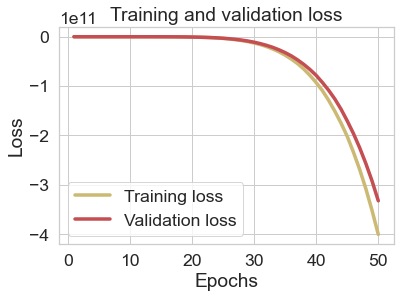

In [265]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Plot the training and validation accuracy

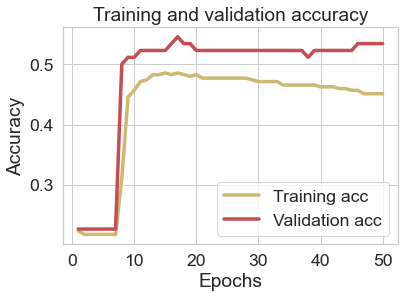

In [266]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### Predicting the test set results

In [267]:
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report, accuracy_score, recall_score, precision_score, f1_score

In [268]:
Y_pred_ANN = ANN_classifier.predict(X_test)
Y_pred_ANN = (Y_pred_ANN > 0.5)

In [269]:
cm_ANN = confusion_matrix(Y_test, Y_pred_ANN)
cm_ANN

array([[29,  1,  0,  0],
       [ 2, 18,  0,  0],
       [ 0, 19,  0,  0],
       [ 0, 19,  0,  0]], dtype=int64)

In [270]:
accuracy_ANN = accuracy_score(Y_test,Y_pred_ANN)
accuracy_ANN

0.5340909090909091

In [271]:
print(classification_report(Y_test,Y_pred_ANN))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95        30
           1       0.32      0.90      0.47        20
           2       0.00      0.00      0.00        19
           3       0.00      0.00      0.00        19

    accuracy                           0.53        88
   macro avg       0.31      0.47      0.35        88
weighted avg       0.39      0.53      0.43        88



C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\Md. Hasib\anaconda3\envs\keras\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### ROC_AUC of ANN

In [272]:
Y_pred_ANN_proba = ANN_classifier.predict_proba(X_test)

In [273]:
roc_auc_score(Y_test,Y_pred_ANN_proba, multi_class="ovr")

ValueError: Target scores need to be probabilities for multiclass roc_auc, i.e. they should sum up to 1.0 over classes